# Etape 1 - Importation et chargement du dataframe

## 1.1 - Importation des librairies

In [1]:
from IPython.display import display, HTML

display(HTML('''
<style>
/* H1 - Très fort */
h1 {
    background-color: #117864;
    color: white;
    padding: 14px 20px;
    border-radius: 8px;
    font-family: 'Segoe UI', sans-serif;
    font-size: 30px;
    font-weight: bold;
    border-left: 6px solid #0e5d4b;
    box-shadow: 2px 2px 8px rgba(0, 0, 0, 0.2);
}

/* H2 - Moyen fort */
h2 {
    background-color: #D1F2EB;
    color: #117864;
    padding: 10px 16px;
    border-radius: 6px;
    font-family: 'Segoe UI', sans-serif;
    font-size: 24px;
    font-weight: 600;
    border-left: 4px solid #117864;
}

/* H3 - Léger */
h3 {
    background-color: #F4FBF9;
    color: #1D8348;
    padding: 8px 14px;
    border-radius: 4px;
    font-family: 'Segoe UI', sans-serif;
    font-size: 18px;
    font-weight: normal;
    border-left: 3px solid #A9DFBF;
}

/* H4 - Très léger */
h4 {
    background-color: #D6EAF8;
    color: #21618C;
    padding: 8px 14px;
    border-radius: 4px;
    font-family: 'Segoe UI', sans-serif;
    font-size: 16px;
    font-weight: bold;
    border-left: 2px solid #5DADE2;
}
</style>
'''))

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from IPython.display import display

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Patch

from sklearn.preprocessing import StandardScaler
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import LabelEncoder

import seaborn as sns
import scipy.stats as st

import warnings

warnings.filterwarnings(
    "ignore",
    category=FutureWarning,
    message=".*default value of `n_init`.*"
)
warnings.filterwarnings(
    "ignore",
    message="KMeans is known to have a memory leak on Windows.*"
)
import warnings
warnings.filterwarnings(
    "ignore",
    message="When grouping with a length-1 list-like, you will need to pass a length-1 tuple",
    category=FutureWarning
)

In [3]:
#Chargement des librairies graphiques
sns.set()

## 1.2 - Analyse univariée & bivariée

In [4]:
# --- 0) Chargement des données ---
df = pd.read_csv("df_final.csv")

# --- 1) Sélection des colonnes numériques ---
num_cols = df.select_dtypes(include=[np.number]).columns
df_num   = df[num_cols]

# --- 2) Statistiques descriptives univariées ---
print("Statistiques descriptives univariées :\n")
display(df_num.describe().T)

Statistiques descriptives univariées :



,count,mean,std,min,25%,50%,75%,max
Importations - Viande de Volailles (milliers de T),127.0,1.151350e+02,2.069130e+02,0.000000e+00,7.500000e+00,3.500000e+01,1.185000e+02,1.069000e+03
% importations volailles vs importations protéines animales,127.0,2.421307e+01,2.545123e+01,0.000000e+00,3.620000e+00,1.628000e+01,3.727000e+01,1.000000e+02
% disponilité protéines (animales) vs protéines totales,127.0,2.705630e+01,1.078926e+01,5.360000e+00,1.793000e+01,2.777000e+01,3.452500e+01,6.259000e+01
% disponilité protéines volaille vs protéines animales,127.0,2.752370e+01,1.482240e+01,8.500000e-01,1.588000e+01,2.682000e+01,3.680000e+01,6.704000e+01
Population (2018),127.0,4.429426e+07,1.285561e+08,1.189265e+06,5.395488e+06,1.230197e+07,3.754676e+07,1.352642e+09
Stabilité politique (2017),127.0,-1.933858e-01,8.958699e-01,-2.930000e+00,-6.900000e-01,-1.100000e-01,4.350000e-01,1.560000e+00
PIB (2018) - Millions USD,127.0,5.540542e+05,1.960799e+06,1.427473e+03,2.180039e+04,8.555539e+04,3.602600e+05,2.065652e+07
Taux de pop. urbaine (2018),127.0,1.794443e+00,1.626901e+00,-2.713554e+00,6.744072e-01,1.874479e+00,2.962822e+00,5.858683e+00
Accès électricité (2018),127.0,8.509606e+01,2.548444e+01,1.010000e+01,8.270000e+01,9.980000e+01,1.000000e+02,1.000000e+02
IPL (2018),127.0,2.907323e+00,5.785991e-01,1.950000e+00,2.455000e+00,2.760000e+00,3.295000e+00,4.200000e+00


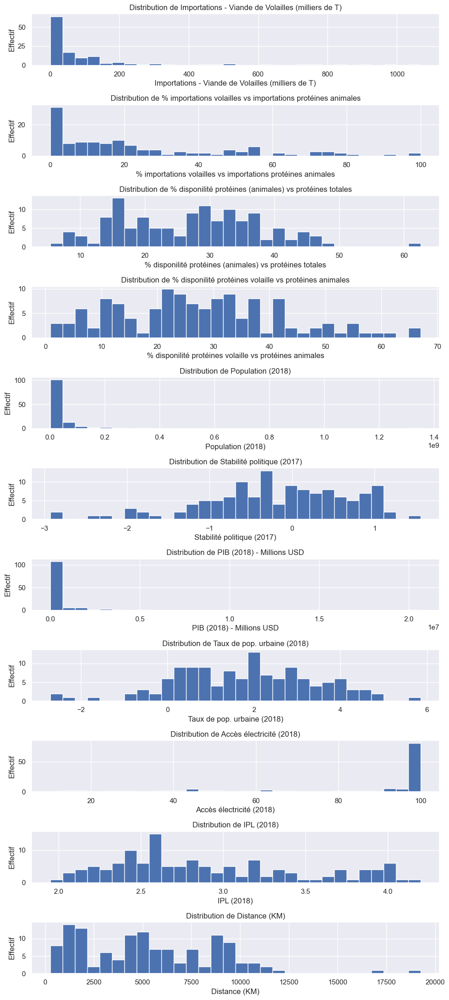

In [5]:
# --- 3) Histogrammes pour chaque variable ---
fig, axes = plt.subplots(len(num_cols), 1, figsize=(10, 2 * len(num_cols)))
# Si une seule variable, axes n'est pas un tableau
if len(num_cols) == 1:
    axes = [axes]
for ax, col in zip(axes, num_cols):
    ax.hist(df_num[col].dropna(), bins=30)
    ax.set_title(f"Distribution de {col}")
    ax.set_xlabel(col)
    ax.set_ylabel("Effectif")
fig.tight_layout()
plt.show()

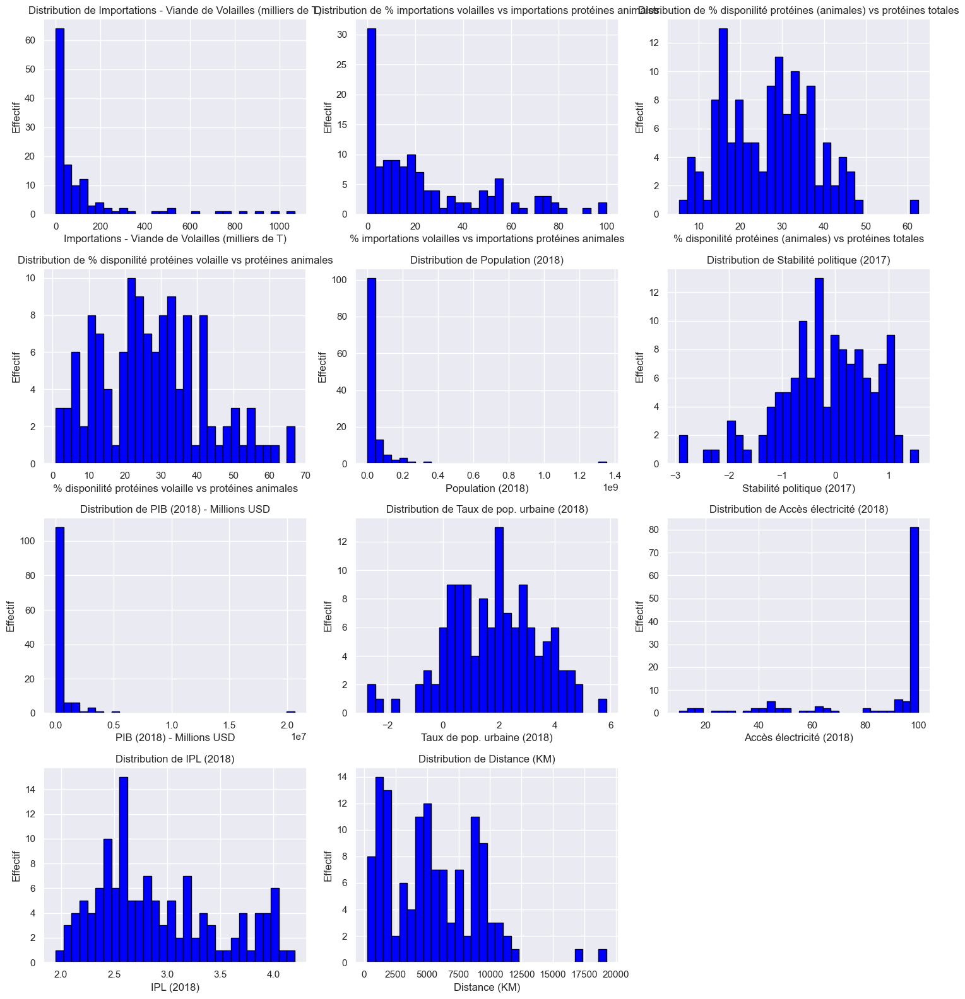

In [6]:
import matplotlib.pyplot as plt
import math

# Sélection automatique des colonnes numériques
num_cols = df_num.select_dtypes(include=['number']).columns.tolist()

ncols = 3   # nombre de colonnes de graphiques
nrows = math.ceil(len(num_cols) / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4 * nrows))
axes = axes.flatten()

for ax, col in zip(axes, num_cols):
    ax.hist(df_num[col].dropna(), bins=30, color="blue", edgecolor="black")
    ax.set_title(f"Distribution de {col}")
    ax.set_xlabel(col)
    ax.set_ylabel("Effectif")

# Masquer les cases vides si le nombre de colonnes n’est pas multiple de ncols
for ax in axes[len(num_cols):]:
    ax.set_visible(False)

fig.tight_layout()
plt.show()

In [7]:
fig.savefig("histogrammes.pdf", dpi=300, bbox_inches="tight")

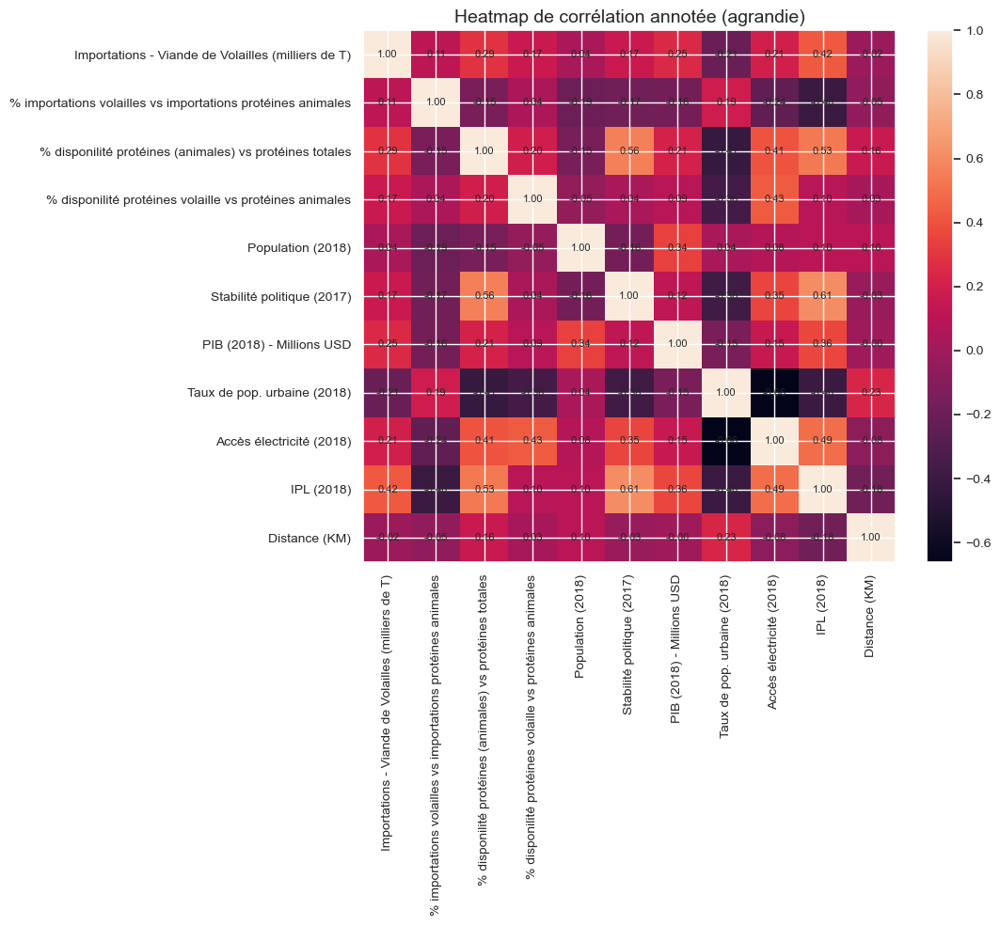

In [8]:
# Recalculez la matrice de corrélation si nécessaire
corr = df_num.corr()

# Tracez la heatmap plus grande
fig, ax = plt.subplots(figsize=(12, 10))   # ← passez ici une taille plus grande
im = ax.imshow(corr, aspect='equal')
cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=10)

# Étiquettes
labels = corr.columns
ax.set_xticks(range(len(labels)))
ax.set_yticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=90, fontsize=10)
ax.set_yticklabels(labels, fontsize=10)

# Annotation des coefficients
for i in range(len(labels)):
    for j in range(len(labels)):
        ax.text(j, i, f"{corr.iloc[i, j]:.2f}",
                ha="center", va="center", fontsize=8)

plt.title("Heatmap de corrélation annotée (agrandie)", fontsize=14)
plt.tight_layout()
plt.show()

## 1.3 - Chargement des fichiers

In [9]:
#Importation du fichier df_final.csv
df_final_iso3 = pd.read_csv('df_final.csv', sep=',')
df_final_iso3.head()

,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM)
0,ARM,Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071
1,AFG,Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381
2,ALB,Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534
3,DZA,Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,Algérie,2.45,1340.390
4,AGO,Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,Angola,2.05,6510.322


In [10]:
#Création nouveau dataframe "df_final"
df_final = df_final_iso3.copy()
df_final.head()

,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM)
0,ARM,Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071
1,AFG,Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381
2,ALB,Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534
3,DZA,Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,Algérie,2.45,1340.390
4,AGO,Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,Angola,2.05,6510.322


In [11]:
#Suppression colonne "Code Zone_ISO3"
df_final.drop('Code Zone_ISO3', axis=1, inplace=True)
df_final.head()

,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM)
0,Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071
1,Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381
2,Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534
3,Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,Algérie,2.45,1340.390
4,Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,Angola,2.05,6510.322


## 1.3 - Data Split

Séparons nos données. Soit X la matrice des données :

In [12]:
# Définir la colonne 'Zone' comme index
df_final = df_final.set_index('Zone')

In [13]:
X = df_final.values
#On visualise que les 5 premières lignes de la matrice
X[:5]

array([[35.0, 56.45, 21.89, 25.53, 2951745, -0.63, 12457.940705,
        -0.2768055434757177, 99.9, 'Arménie', 2.61, 3434.071],
       [29.0, 70.73, 7.58, 13.17, 37171921, -2.79, 18856.319311,
        3.876432657376668, 93.4, 'Afghanistan', 1.95, 5590.381],
       [38.0, 53.52, 18.79, 27.88, 2882740, 0.37, 15156.427728,
        1.3171621044569777, 100.0, 'Albanie', 2.66, 1603.534],
       [2.0, 1.67, 8.95, 23.71, 42228408, -0.92, 174910.894611,
        2.7354267614943666, 99.6, 'Algérie', 2.45, 1340.39],
       [277.0, 43.08, 27.75, 23.98, 30809787, -0.39, 101353.211188,
        4.488892322292039, 45.3, 'Angola', 2.05, 6510.322]], dtype=object)

In [14]:
#On vérifie que c'est bien un numpy array :
type(X)

numpy.ndarray

In [15]:
#La forme de cette matrice est conforme à nos attentes :
X.shape

(127, 12)

Enregistrons les noms de nos cours dans une variable "names" :

In [16]:
names = df_final.index
names

Index(['Arménie', 'Afghanistan', 'Albanie', 'Algérie', 'Angola', 'Argentine',
       'Australie', 'Autriche', 'Bangladesh', 'Bolivie',
       ...
       'Royaume-Uni', 'Ukraine', 'États-Unis', 'Burkina Faso', 'Uruguay',
       'Venezuela', 'Viet Nam', 'Yémen, Rép. du', 'Zambie', 'Belgique'],
      dtype='object', name='Zone', length=127)

Enregistrons nos colonnes dans une variable "features" :

In [17]:
features = df_final.columns
features

Index(['Importations - Viande de Volailles (milliers de T)',
       '% importations volailles vs importations protéines animales',
       '% disponilité protéines (animales) vs protéines totales',
       '% disponilité protéines volaille vs protéines animales',
       'Population (2018)', 'Stabilité politique (2017)',
       'PIB (2018) - Millions USD', 'Taux de pop. urbaine (2018)',
       'Accès électricité (2018)', 'Country Name', 'IPL (2018)',
       'Distance (KM)'],
      dtype='object')

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.4 - Scaling</h3>
</div>

In [18]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 1) Reprenez votre DataFrame d’origine, par exemple df_dispo_correlation
df_corr = df_final.copy()

# 2) Sélectionnez uniquement les colonnes numériques
X_num = df_corr.select_dtypes(include=[np.number])

# 3) (Optionnel) Traitez les NaN avant le scaling
X_num = X_num.fillna(X_num.mean())

# 4) Instanciez et appliquez StandardScaler sur ce DataFrame numérique
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_num)

# 5) Reconstituez un DataFrame pour conserver labels et index
X_scaled_df = pd.DataFrame(
    X_scaled,
    columns=X_num.columns,
    index=X_num.index
)

# 6) Affichez un aperçu
print("Colonnes scalées :", X_num.columns.tolist())
display(X_scaled_df.head())

Colonnes scalées : ['Importations - Viande de Volailles (milliers de T)', '% importations volailles vs importations protéines animales', '% disponilité protéines (animales) vs protéines totales', '% disponilité protéines volaille vs protéines animales', 'Population (2018)', 'Stabilité politique (2017)', 'PIB (2018) - Millions USD', 'Taux de pop. urbaine (2018)', 'Accès électricité (2018)', 'IPL (2018)', 'Distance (KM)']


,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM)
Zone,,,,,,,,,,,
Arménie,-0.388822,1.271632,-0.480733,-0.135039,-0.322865,-0.489294,-0.277306,-1.278167,0.583202,-0.515902,-0.539981
Afghanistan,-0.417935,1.834927,-1.812304,-0.972214,-0.055622,-2.909907,-0.274030,1.284796,0.327134,-1.661106,0.066508
Albanie,-0.374266,1.156054,-0.769194,0.024133,-0.323404,0.631361,-0.275924,-0.294530,0.587141,-0.429144,-1.054842
Algérie,-0.548941,-0.889244,-1.684824,-0.258312,-0.016133,-0.814283,-0.194127,0.580681,0.571383,-0.793527,-1.128855
Angola,0.785384,0.744233,0.064550,-0.240024,-0.105307,-0.220337,-0.231790,1.662744,-1.567767,-1.487590,0.325253


In [19]:
import numpy as np
from sklearn.preprocessing import StandardScaler
import pandas as pd

# --- 1) Recréez X à partir de votre DataFrame d'origine (par ex. df_dispo_correlation) ---
# On ne garde que le numérique
X_df = df_corr.select_dtypes(include=[np.number]).copy()

# (Optionnel) gérez les NaN si nécessaire
X_df = X_df.fillna(X_df.mean())

# Vérification rapide : 
print("Colonnes scalées :", X_df.columns.tolist())

# --- 2) Instanciation du scaler ---
scaler = StandardScaler()

# --- 3) Fit + transform ---
X_scaled = scaler.fit_transform(X_df)

# --- 4) Si vous voulez un DataFrame (pour garder noms de colonnes & index) ---
X_scaled_df = pd.DataFrame(
    X_scaled,
    columns=X_df.columns,
    index=X_df.index
)

# --- 5) Affichez les 5 premières lignes ---
display(X_scaled_df.head())

Colonnes scalées : ['Importations - Viande de Volailles (milliers de T)', '% importations volailles vs importations protéines animales', '% disponilité protéines (animales) vs protéines totales', '% disponilité protéines volaille vs protéines animales', 'Population (2018)', 'Stabilité politique (2017)', 'PIB (2018) - Millions USD', 'Taux de pop. urbaine (2018)', 'Accès électricité (2018)', 'IPL (2018)', 'Distance (KM)']


,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM)
Zone,,,,,,,,,,,
Arménie,-0.388822,1.271632,-0.480733,-0.135039,-0.322865,-0.489294,-0.277306,-1.278167,0.583202,-0.515902,-0.539981
Afghanistan,-0.417935,1.834927,-1.812304,-0.972214,-0.055622,-2.909907,-0.274030,1.284796,0.327134,-1.661106,0.066508
Albanie,-0.374266,1.156054,-0.769194,0.024133,-0.323404,0.631361,-0.275924,-0.294530,0.587141,-0.429144,-1.054842
Algérie,-0.548941,-0.889244,-1.684824,-0.258312,-0.016133,-0.814283,-0.194127,0.580681,0.571383,-0.793527,-1.128855
Angola,0.785384,0.744233,0.064550,-0.240024,-0.105307,-0.220337,-0.231790,1.662744,-1.567767,-1.487590,0.325253


In [20]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# 1) Remplacez df_final par le nom de votre DataFrame
#    et assurez-vous qu’il contient bien uniquement des colonnes numériques
X = df_final.select_dtypes(include=[np.number]).copy()

# 2) (Optionnel) Impute les NaN
X = X.fillna(X.mean())

# 3) Instanciation du scaler
scaler = StandardScaler()

# 4) Fit_transform : centrage et réduction
X_scaled = scaler.fit_transform(X)

# 5) Reconstituez un DataFrame pour garder labels et index
X_scaled_df = pd.DataFrame(
    X_scaled,
    columns=X.columns,
    index=X.index
)

# Affichez les premières lignes
print(X_scaled_df.head())

             Importations - Viande de Volailles (milliers de T)  \
Zone                                                              
Arménie                                              -0.388822    
Afghanistan                                          -0.417935    
Albanie                                              -0.374266    
Algérie                                              -0.548941    
Angola                                                0.785384    

             % importations volailles vs importations protéines animales  \
Zone                                                                       
Arménie                                               1.271632             
Afghanistan                                           1.834927             
Albanie                                               1.156054             
Algérie                                              -0.889244             
Angola                                                0.744233            

On espère avoir une moyenne à 0 et un écart type à 1 :

In [21]:
idx = ["mean", "std"]
pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]

,0,1,2,3,4,5,6,7,8,9,10
mean,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [22]:
#ACP - 5 composantes
n_components = 5
x_list = range(1, n_components+1)
pca = PCA(n_components=n_components)
pca.fit(X_scaled)

PCA(n_components=5)

# Etape 2- ACP (Analyse en Composantes Principales)

Objectifs de l'ACP : 
- Etudier la variabilité entre les individus : similarités/différences entre individus
- Etudier les liaisons entre les variables : y a-t-il des groupes de variables très corrélées, pouvant être regroupées en de nouvelles variables synthétiques ? Peut-on réduire le nombre de dimensions de nos données pour accélerer les calculs ?

Il y a plusieurs opérations à effectuer dans l'ACP :

Le centrage : on s’arrange pour transformer nos variables de telle manière que leur moyenne soit égale à 0 et que leur variance soit égale à 1. Pour effectuer un centrage sur des observations, il faut soustraire à toutes ces observations leur moyenne. Visuellement après centrage, le centre de l’ellipse a pour coordonnées (0,0). Chaque colonne de l’échantillon correspond à une dimension de l’espace et chaque ligne (chaque individu) correspond à un point dans cet espace. Rp = Espace à p dimensions + nuage d’individus NI

La réduction : Après avoir centré les données, si on les divise par leur écart-type (l’écart-type est la racine carrée de la variance), alors on obtient des valeurs dont la variance vaut 1. Visuellement, quand on réduit, l’ellipse devient alors un cercle, car la variable en abscisse a maintenant la même importance que celle en ordonnée (il n’y a plus d’aplatissement). Ici c'est l'inverse du centrage : chaque ligne correspondra à une dimension, et chaque colonne à un point dans l'espace. Rn = Espace à n dimensions + nuage des variables NK

## 2.1 - Eboulis des valeurs propres

Le nombre maximal de composantes d’une ACP sera le minimum entre p et n-1 : ici ce sera p=14 composantes max.

Objectif : Déterminer combien de composantes on va pouvoir retenir pour l'ACP.

Diagramme d'éboulis des valeurs propres : décrit le pourcentage d’inertie totale associé à chaque axe. Quand on additionne les inerties associées à tous les axes, on obtient l’inertie totale du nuage des individus (en ACP, on projette les données sur les axes principaux d’inertie, et que ceux-ci sont ordonnés selon l’inertie du nuage projeté : de la plus grande à la plus petite). Exemple :

Si 75 % de l’inertie totale sont associés à F1 et 25 % à F2 : le 1er plan factoriel représente 100 % de l’inertie totale. La représentation est parfaite, pas besoin d’afficher F3, F4,..., car ils ne contiendront aucune info.
Si 20 % de l’inertie totale sont associés à F1 et 15 % à F2 : le 1er plan factoriel ne représente alors que 35 % de l’inertie totale ce qui est peu donc on peut analyser les composantes suivantes (F3,F4,...).


In [23]:
#Utilisation de PCA de scikit-learn

# On instancie notre ACP :
n_components = 7
pca = PCA(n_components=n_components)    #On cherche à regrouper nos variables pour en réduire le nombre, partons sur un nombre de composantes divisé par 2 pour l'affichage des éboulis
# On l'entraine sur les données scalées :
pca.fit(X_scaled)

PCA(n_components=7)

In [24]:
#Calcul variance captée par chaque nouvelle composante :
pca.explained_variance_ratio_

#Cela signifique que la 1ère composante capte 34.5% de la variance de nos données initiales, la 2ème 13.8%, la 3e 11.7%, la 4e 10.4% etc...

array([0.31160699, 0.13606074, 0.11369394, 0.10620084, 0.10101209,
       0.05836335, 0.05357577])

In [25]:
#Engistrement des variances des composantes dans une nouvelle variable :
scree = (pca.explained_variance_ratio_*100).round(2)
scree

#Cela représente une somme cumulée : Les 2 1eres composantes captent donc 34.5+13.6 = 48.1% de la variance, les 3 premières 34.5+13.6+11.7 = 59.8% de la variance etc...

array([31.16, 13.61, 11.37, 10.62, 10.1 ,  5.84,  5.36])

In [26]:
#Création d'une somme cumulée :
scree_cum = scree.cumsum().round()
scree_cum

array([31., 45., 56., 67., 77., 83., 88.])

In [27]:
#Définition d'une variable avec la liste des composantes :
x_list = range(1, n_components+1)
list(x_list)

[1, 2, 3, 4, 5, 6, 7]

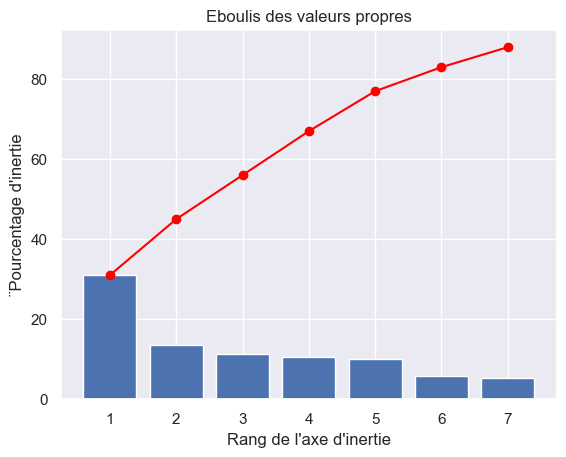

In [28]:
#Affichage du graphique des éboulis des valeurs propres

plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')   #On a en bleu la variance de chaque nouvelle composante, et en rouge la variance cumulée.

plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("¨Pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

Interprétation :

- "Critère de Kaiser" : On ne retient pas les axes dont l’inertie associée est <(100/p)% soit =(100/12)% =8.33% ici (représentent moins de variabilité qu’une seule variable initiale). Dans notre cas, on ne retient pas les composantes n°6 et 7 car elles représentent respectivement 5.1% et 4.5% d'inertie.
- "Méthode du coude" : On remarque une zone à partir de laquelle le % d’inertie diminue beaucoup plus lentement lorsque l’on parcourt le diagramme des éboulis de gauche à droite : cette zone se situe entre la 5e et la 6e barre représentant les composantes .
- % cumulé de variance expliquée : On constate sur le graphique que 80% de la variance est comprise dans les 5 premières composantes, et 90% dans les 7 premières composantes .
- Conclusion : On retient finalement 5 composantes (80%. Nous aurons 2 plans à générer (plan F1-F2, plan F3-F4-F5.)

## 2.2 - Composantes

In [29]:
#Définition d'une variable avec le calcul des composantes (avec attribut "components_")
pcs = pca.components_
pcs

array([[ 0.24733313, -0.19365326,  0.39114086,  0.2075166 ,  0.02043911,
         0.36655341,  0.21675878, -0.39371733,  0.40884705,  0.44520504,
        -0.05594753],
       [ 0.01561807, -0.37828847, -0.12611759, -0.23046912,  0.65865379,
        -0.14105217,  0.48714849,  0.19167218, -0.07957666,  0.15758959,
         0.16938983],
       [ 0.17196047,  0.26502568, -0.26080448,  0.58135287,  0.28013534,
        -0.44661759,  0.15466658, -0.23332289,  0.26726554, -0.21264117,
        -0.14577144],
       [ 0.46398545,  0.40451597,  0.30973826,  0.13058697, -0.0444243 ,
         0.02790196,  0.18358613,  0.2622263 , -0.17745336, -0.05397815,
         0.60701871],
       [ 0.46886903,  0.35727637, -0.12876634, -0.30997575, -0.03812788,
         0.03985683,  0.22418782,  0.07290921, -0.233532  ,  0.21369058,
        -0.61727676],
       [-0.5622866 ,  0.24505431,  0.17761715,  0.14087518, -0.16268925,
         0.1741267 ,  0.67038419, -0.02390992, -0.15663099, -0.15824976,
        -0.126

In [30]:
#Affichage en version pandas
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6,7,8,9,10
0,0.247333,-0.193653,0.391141,0.207517,0.020439,0.366553,0.216759,-0.393717,0.408847,0.445205,-0.055948
1,0.015618,-0.378288,-0.126118,-0.230469,0.658654,-0.141052,0.487148,0.191672,-0.079577,0.157590,0.169390
2,0.171960,0.265026,-0.260804,0.581353,0.280135,-0.446618,0.154667,-0.233323,0.267266,-0.212641,-0.145771
3,0.463985,0.404516,0.309738,0.130587,-0.044424,0.027902,0.183586,0.262226,-0.177453,-0.053978,0.607019
4,0.468869,0.357276,-0.128766,-0.309976,-0.038128,0.039857,0.224188,0.072909,-0.233532,0.213691,-0.617277
5,-0.562287,0.245054,0.177617,0.140875,-0.162689,0.174127,0.670384,-0.023910,-0.156631,-0.158250,-0.126640
6,-0.193499,0.540302,0.065207,-0.363603,0.522419,0.286327,-0.211974,-0.230122,0.245245,-0.120186,0.082395


In [31]:
# Chargement du fichier CSV
df = pd.read_csv("df_final.csv")

# Sélection des colonnes numériques uniquement
X_num = df.select_dtypes(include=[np.number])

# Vérification du nombre de colonnes
features = X_num.columns.tolist()

# Imputation des valeurs manquantes si nécessaire
X_num = X_num.fillna(X_num.mean())

# Standardisation des données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_num)

# PCA
n_components = min(len(features), 7)  # pour éviter plus de composantes que de features
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)

# Matrice des composantes principales (loadings)
pcs = pd.DataFrame(
    pca.components_.T,
    index=features,
    columns=[f"F{i+1}" for i in range(n_components)]
)
pcs


,F1,F2,F3,F4,F5,F6,F7
Importations - Viande de Volailles (milliers de T),0.247333,0.015618,0.171960,0.463985,0.468869,-0.562287,-0.193499
% importations volailles vs importations protéines animales,-0.193653,-0.378288,0.265026,0.404516,0.357276,0.245054,0.540302
% disponilité protéines (animales) vs protéines totales,0.391141,-0.126118,-0.260804,0.309738,-0.128766,0.177617,0.065207
% disponilité protéines volaille vs protéines animales,0.207517,-0.230469,0.581353,0.130587,-0.309976,0.140875,-0.363603
Population (2018),0.020439,0.658654,0.280135,-0.044424,-0.038128,-0.162689,0.522419
Stabilité politique (2017),0.366553,-0.141052,-0.446618,0.027902,0.039857,0.174127,0.286327
PIB (2018) - Millions USD,0.216759,0.487148,0.154667,0.183586,0.224188,0.670384,-0.211974
Taux de pop. urbaine (2018),-0.393717,0.191672,-0.233323,0.262226,0.072909,-0.023910,-0.230122
Accès électricité (2018),0.408847,-0.079577,0.267266,-0.177453,-0.233532,-0.156631,0.245245
IPL (2018),0.445205,0.157590,-0.212641,-0.053978,0.213691,-0.158250,-0.120186


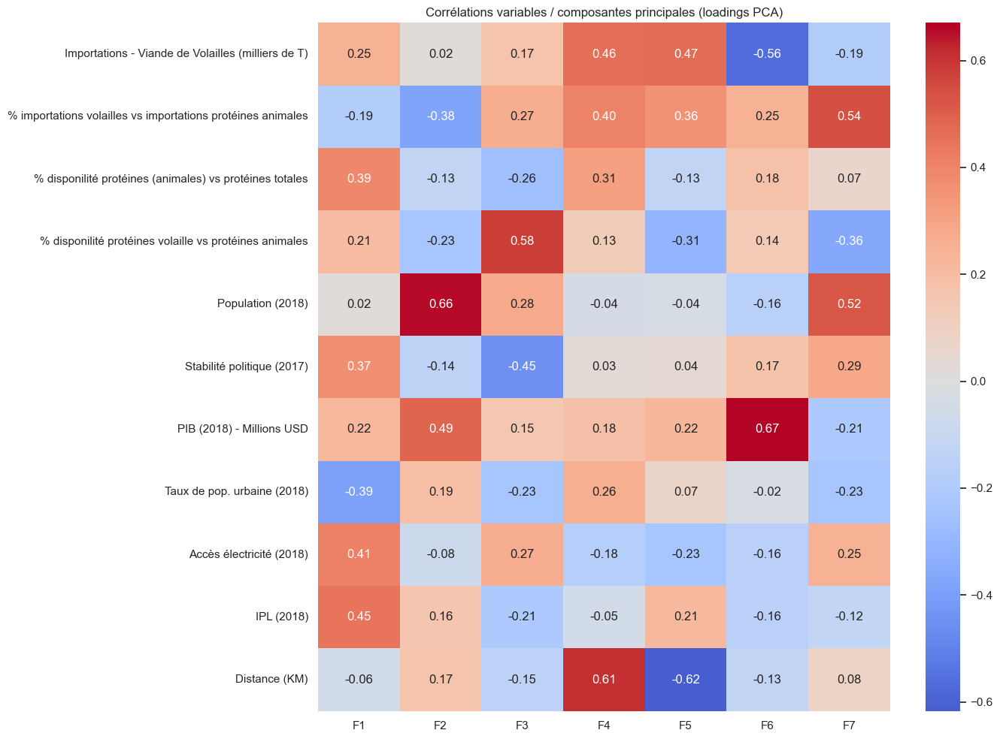

In [32]:
# Affichage de la heatmap des loadings
plt.figure(figsize=(14, 10))
sns.heatmap(pcs, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title("Corrélations variables / composantes principales (loadings PCA)")
plt.tight_layout()
plt.show()

Interprétation :

- Principales contributions à F1 : IPL (en positif) // Taux de pop. urbaine + % Var. population (en négatif)
- Principales contributions à F2 : PIB + Population (en positif)
- Principales contributions à F3 : % Importations volailles vs protéines animales + Importations de volailles (en positif)
- Principales contributions à F4 : Distance (en positif)
- Principales contributions à F5 : % Importations volailles vs importations protéines animales + Distance (en positif)

## 2.3 - Cercles de corrélation

Objectif du cercle de corrélation : Déterminer la corrélation entre une variable initiale et l'un des axes d'inertie (et non pas entre 2 variables initiales)

In [33]:
#Définition des axes x,y
x, y = 0,1     #Remarque : en code on compte à partir de 0

Cercle de corrélation des axes d'inertie F1 + F2 :

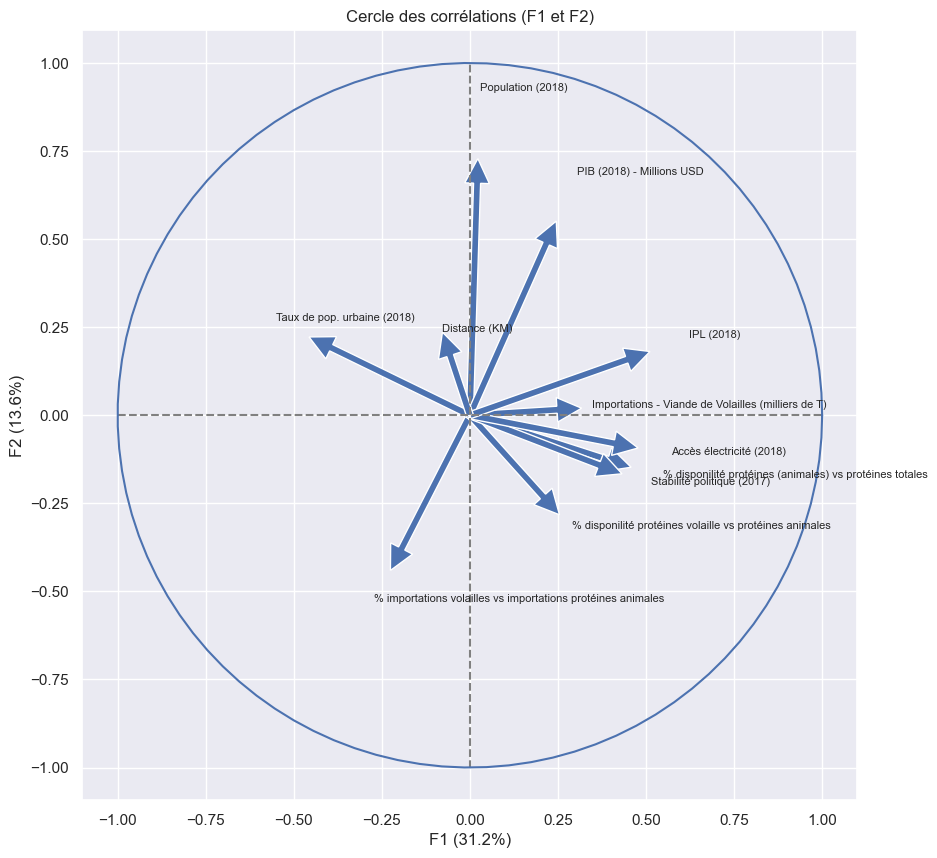

In [34]:
#Affichage du cercle de corrélation des axes d'inertie F1 + F2

#ax.arrow(x, y, dx, dy) => avec (x,y) comme position de départ et avec (dx, dy) comme vecteurs de déplacement de la flèche

fig, ax = plt.subplots(figsize=(10, 10))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0, 0, # Place l'origine de la flèche à (0,0)
             pca.components_[0, i],  #dx=0 for PC1
             pca.components_[1, i],  #dy=1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.02)

    plt.text(pca.components_[0, i] * 1.4,
             pca.components_[1, i] * 1.4,
             features[i], fontsize=8)
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.show(block=False)

On peut en faire une fonction :

In [35]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 10))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] * 1.25,
                pca.components_[y, i] * 1.25,
                features[i], fontsize=8)
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

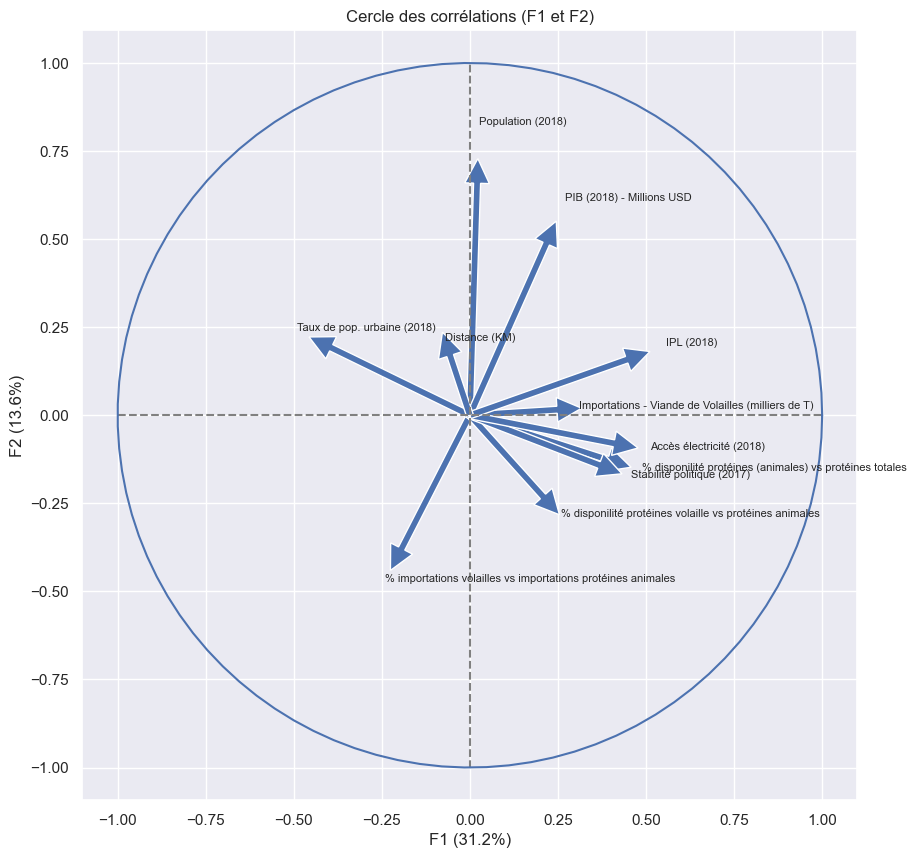

In [36]:
#On applique cette fonction pour les axes d'inertie F1 + F2 :
x_y = (0,1)
x_y

#Affichage du cercle des corrélation F1 et F2 :
correlation_graph(pca, x_y, features)

VARIABLES INITIALES CORRELEES A L'AXE D'INERTIE F1 =>

Moyennement corrélées positivement à F1:

- IPL (Indice de performance logistique)
- Accès électricité

Moyennement corrélées négativement à F1 :

- Taux de pop. urbaine (2018)
- % var. population (2013-2018)

Pour résumer :

- F1 est moyennement représenté à la hausse par les variables initiales "IPL" et "Accès électricité" => Le lien est la qualité des infrastructures propre à chaque pays (notamment les infrastructures électriques)
- F1 est moyennement représenté à la baisse par les variables initiales "Taux de pop. urbaine" et "% var. population" : Ici il est question de la transformation démographique et urbaine
- Les autres variables initiales sont trop peu corrélées à F1 et ne vont donc pas influer sur l'axe d'inertie F1

VARIABLES INITIALES CORRELEES A L'AXE D'INERTIE F2 =>

Fortement corrélées positivement à F2 :

- PIB (2018)
- Population (2018)

Pour résumer :

- F2 est fortement représenté à la hausse par les variables initiales "PIB" et "Population" : Le dénominateur commun ici est la richesse économique et démographique (le PIB mesure la richesse économique mais son calcul est souvent corrélé à la population : un pays fortement peuplé produit souvent un fort PIB en valeur absolue)
- Les autres variables initiales sont trop peu corrélées à F2 et ne vont donc pas influer sur l'axe d'inertie F2

Interprétation :

- L'axe F1 peut être vu comme un axe représentant l'accès à des infrastructures développées et la transition sociodémographique rapide (urbanisation + croissance de la population)
- L'axe F2 peut être vu comme un axe de richesse économique et démographique

Cercle de corrélation des axes d'inertie F3 + F4 :

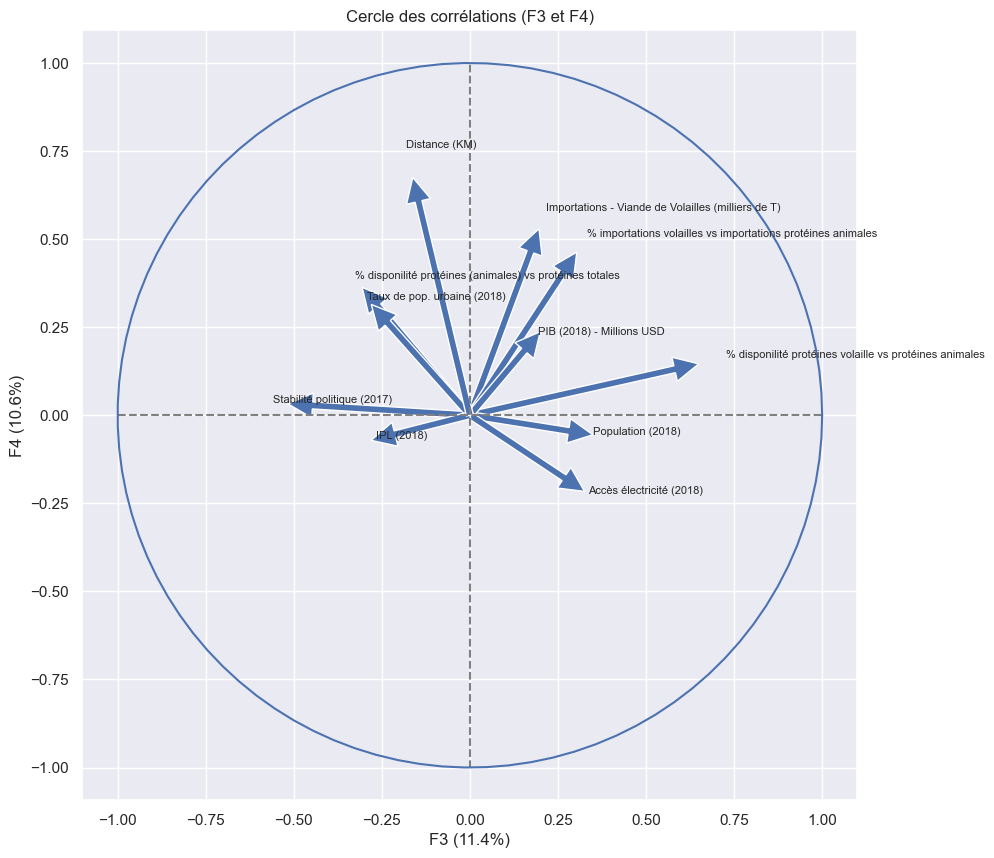

In [37]:
#Affichage du cercle de corrélation des axes d'inertie F3 + F4
correlation_graph(pca, (2,3), features)

VARIABLES INITIALES CORRELEES A L'AXE D'INERTIE F3 =>


Fortement corrélée positivement :
- % Importations volailles vs importations protéines animales

Moyennement corrélée positivement :
- Importations viande de volailles (milliers de T)

Pour résumer :
- F3 est essentiellement représentée à la hausse par les variables initiales "% Importations volailles vs importations protéines animales" et "Importations viande de volailles" : On parle ici de la dépendance commerciale vis-à-vis de la volaille
- Les autres variables initiales sont trop peu corrélées à F3 et ne vont donc pas influer sur l'axe d'inertie F3

VARIABLES INITIALES CORRELEES A L'AXE D'INERTIE F4 =>

Fortement corrélée positivement :

- Distance

Moyennement corrélées positivement :
- Taux de population urbaine (2018)
- % var. population (2013-2018)

Pour résumer :

- F4 est fortement représenté à la hausse par les variables initiales "Distance", "Taux de population urbaine" et "% variation population" : les notions de localisation géographique et d'urbanisation interviennent ici.
- Les autres variables initiales sont trop peu corrélées à F4 et ne vont donc pas influer sur F4


Interprétation :

- L'axe F3 peut être vu comme le degré de dépendance alimentaire à la volaille comme source principale de protéine animale
- L'axe F4 traduit comment les territoires se transforment en fonction de leur localisation géographique, leur degré d’urbanisation et leur vitalité démographique

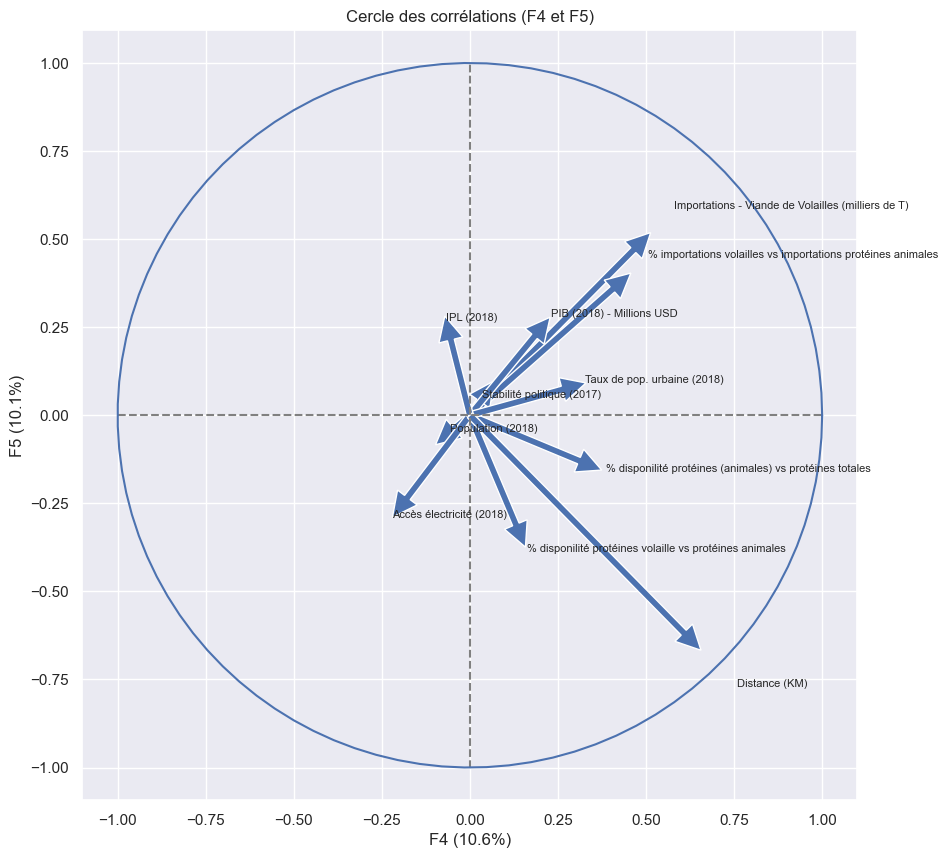

In [38]:
#Affichage du cercle de corrélation des axes d'inertie F4 + F5
correlation_graph(pca, (3,4), features)

VARIABLES INITIALES CORRELEES A L'AXE D'INERTIE F5 =>

Fortement corrélée positivement :
- % Disponibilité protéines volailles vs protéines animales

Moyennement corrélées postivement :
- Distance
- Population (2018)

Moyennement corrélée négativement :
- Stabilité politique

Pour résumer :
- F5 est fortement représenté à la hausse par le "% Disponibilité protéines volailles vs protéines animales", "Distance" et "Population", et moyennement représenté à la baisse par "Stabilité politique" : Cela signifie qu'une consommation de protéines animales essentiellement composée de volaille combinée à une faible stabilité politique vont avoir une projection positive sur F5 (faire augmenter F5). A l'inverse, une faible consommation de volailles en protéines animales combinée à une forte stabilité politique vont avoir une projection négative sur F5 (faire baisser F5). 
- Les autres variables initiales sont trop peu corrélées à F5 et ne vont donc pas influer sur F5

Interprétation :

- L'axe F5 réprésente donc la dépendance alimentaire sous contraintes politiques et géographiques

## 2.4 - Projection des individus

In [39]:
#Calcul des coordonnées de nos individus dans le nouvel espace
X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[-0.26233614, -1.13826081,  1.0447277 , -0.62135824,  0.30010605,
         0.29650236,  0.98474212],
       [-3.61184931, -0.0379902 ,  1.69472641,  0.1399051 ,  0.44031347,
        -0.28306164,  0.49314308],
       [-0.2233177 , -1.13768622,  0.5120769 , -0.75835013,  0.70558595,
         0.45466915,  0.88485275],
       [-1.3022022 ,  0.35906086,  0.63881526, -1.81917009,  0.08271851,
        -0.34904434, -0.58174979],
       [-2.08370067, -0.10916411, -0.32907852,  1.60204025,  0.6121955 ,
        -0.05817842, -0.28888257]])

In [40]:
#Fonction pour projeter les dimensions en 2D

def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, c="red", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], c="red")

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des pays (sur F{x+1} et F{y+1})")
    plt.show()

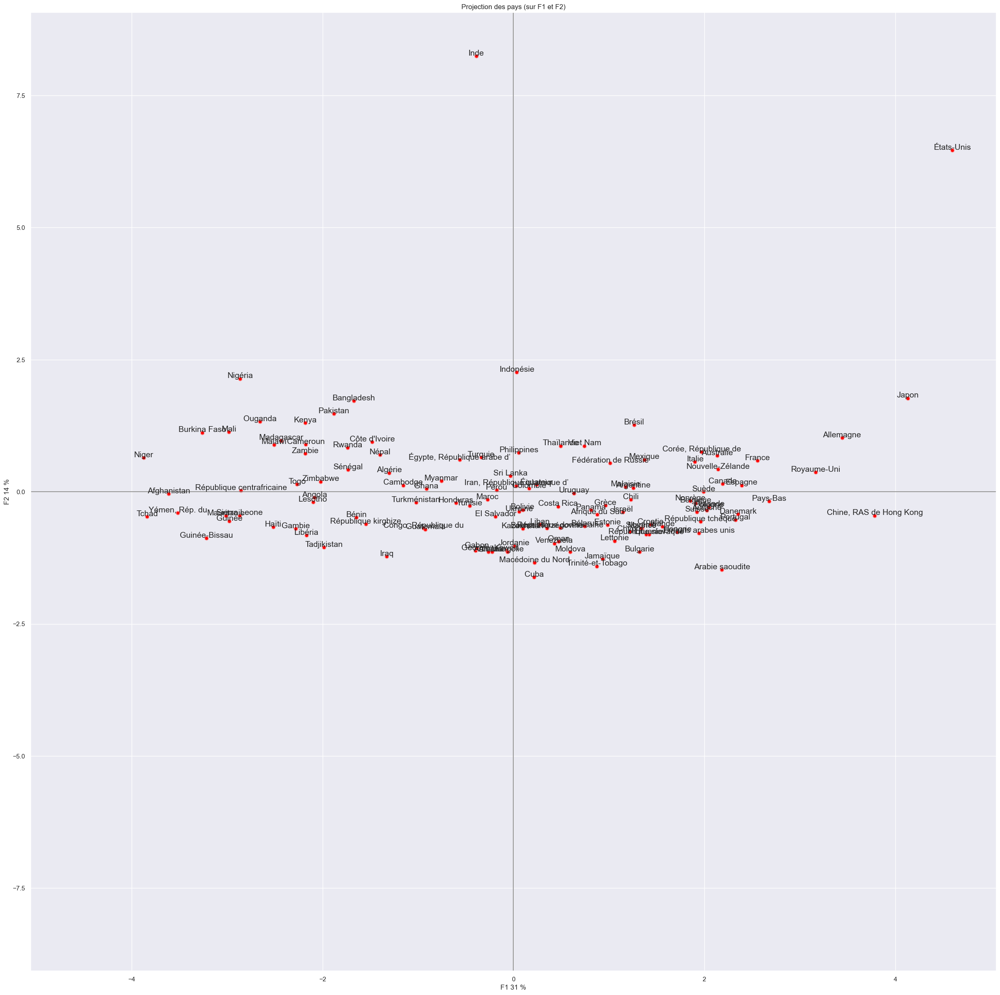

In [41]:
#Affichage graphique de la projection des pays sur F1 + F2

#Projette les données centrées-réduites sur les composantes principales
X_projected = pca.transform(X_scaled)  
#Choix des axes pour la projection des pays
x_y = [0,1]    
#Fonction personnalisée pour afficher les individus
display_factorial_planes(X_projected, x_y, pca, labels=names, figsize=(30,30), clusters=df_final['Population (2018)'], marker="o")    #Code couleur selon la population

Rappel interprétations cercles de corrélation :

- F1 : axe d'accès à des infrastructures développées et de transition sociodémographique rapide
- F2 : axe de richesse économique et démographique

Interprétation projection des pays sur F1/F2 :

- Dans notre cas, pour le développement de l'activité de vente de poulets, on va plutôt s'intéresser aux pays disposant d'infrastructures de qualité (influe positivement F1), à forte urbanisation (influe négativement F1), forte croissance de la population (influe négativement F1) et à forte création de richesse (influe postivement F2).
- Par rapport aux cercles de corrélations précédents, cela correspond aux pays projetés dans la zone du cadre supérieur droit (Allemagne, Japon), ou de la zone centrale haute (Inde).

Projection des pays sur F3 et F4 :

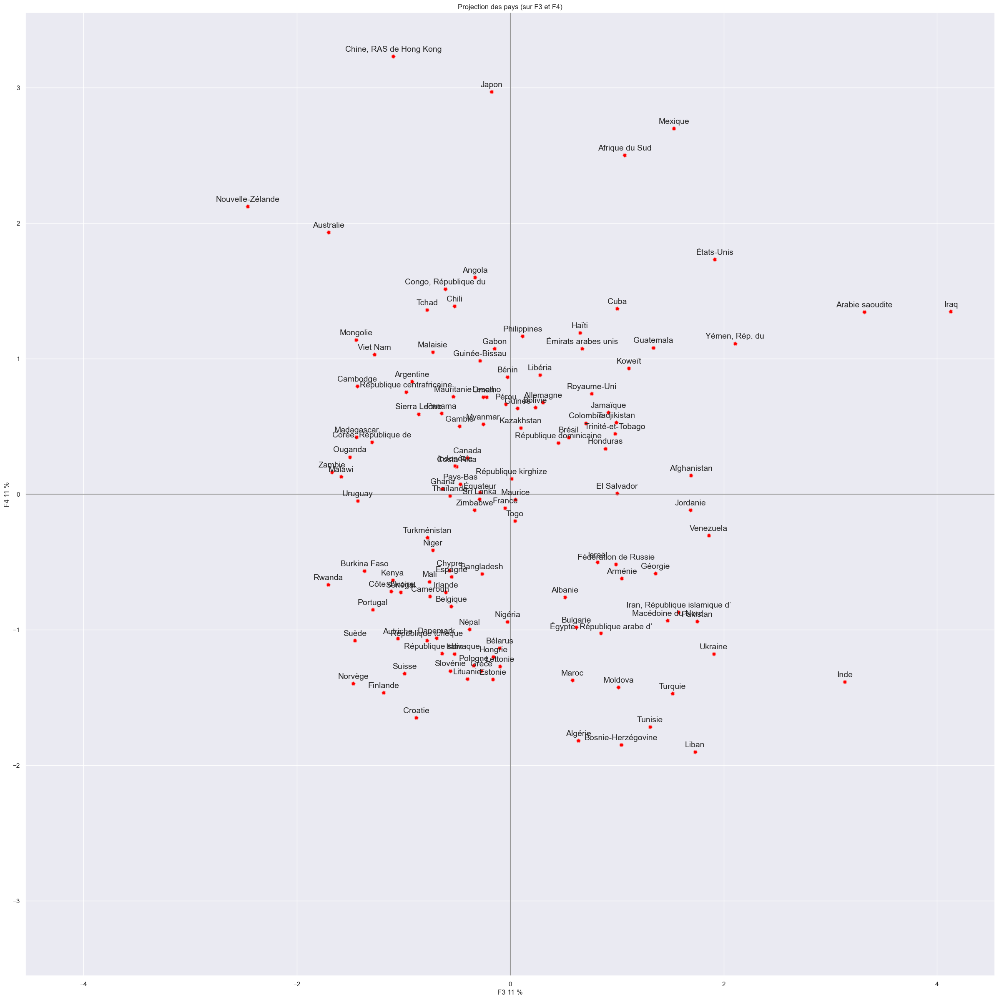

In [42]:
#Affichage graphique de la projection des pays sur F3 + F4
x_y = [2,3]
display_factorial_planes(X_projected, x_y, pca, labels=names, figsize=(30,30), clusters=df_final['Population (2018)'],marker="o")

Rappel interprétations cercles de corrélation :

- F3 : degré de dépendance alimentaire à la volaille comme source principale de protéine animale
- F4 : comment les territoires se transforment en fonction de leur localisation géographique, leur degré d’urbanisation et leur vitalité démographique

Interprétation projection des pays sur F3/F4 :

- Dans notre cas, pour le développement de l'activité de vente de poulets, on va plutôt s'intéresser aux pays disposant d'un fort degré de dépendance alimentaire à la volaille en termes de consommation de protéine animale et à forte urbanisation et forte croissance démographique.
- Par rapport aux cercles de corrélations précédents, cela correspond aux pays projetés dans la zone du cadre supérieur droit (Japon, Afrique du Sud, Mexique, Koweit...)

Projection des pays sur F4 et F5 :

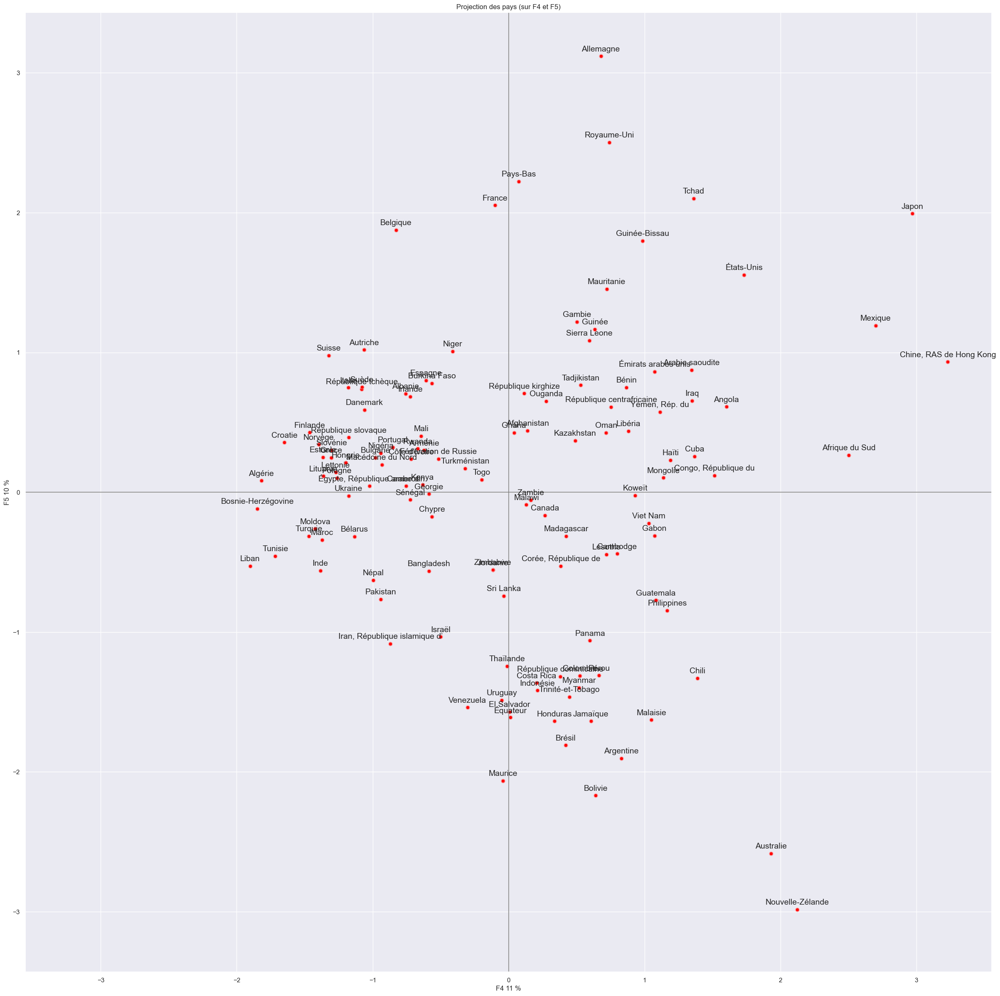

In [43]:
#Affichage graphique de la projection des pays sur F4 + F5
x_y = [3,4]
display_factorial_planes(X_projected, x_y, pca, labels=names, figsize=(30,30), clusters=df_final['Population (2018)'],marker="o")

Rappel interprétations cercles de corrélation :

- F4 : comment les territoires se transforment en fonction de leur localisation géographique, leur degré d’urbanisation et leur vitalité démographique
- F5 : dépendance alimentaire sous contraintes politiques

Interprétation projection des pays sur F4/F5 :

- Dans notre cas, pour le développement de l'activité de vente de poulets, on va plutôt s'intéresser aux pays les plus proches possibles de la France (influe positivement F4), forte urbanisation et à forte croissance démographique (influe positivement F4), fortement dépendants à la volailles en approvisionnement externe (influe positivement F5), les plus proches possibles de la France (influe positivement F5), et à forte stabilité politique (influe négativement F5).
- Par rapport aux cercles de corrélations précédents, cela correspond aux pays projetés dans la zone des cadres inférieurs.

In [44]:
#Fonction pour projeter les dimensions en 3D

def display_factorial_3d(X_projected, pca=None, labels=None, clusters=None, figsize=(12, 10), marker='o'):
    X_ = np.array(X_projected)
    
    # Vérification dimensions
    if X_.shape[1] < 3:
        raise ValueError("Il faut au moins 3 composantes principales pour une projection 3D")

    # Extraction des axes F3, F4, F5
    f3, f4, f5 = X_[:, 2], X_[:, 3], X_[:, 4]

    # Initialisation de la figure 3D
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')

    # Clusters en couleur
    c = None if clusters is None else clusters
    sc = ax.scatter(f3, f4, f5, c=c, cmap='viridis', s=60, marker=marker)

    # Affichage des labels
    if labels is not None:
        for i in range(len(labels)):
            ax.text(f3[i], f4[i], f5[i], labels[i], size=8)

    # Labels des axes avec % de variance expliquée
    if pca:
        ax.set_xlabel(f'F3 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
        ax.set_ylabel(f'F4 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
        ax.set_zlabel(f'F5 ({pca.explained_variance_ratio_[2]*100:.1f}%)')
    else:
        ax.set_xlabel('F3')
        ax.set_ylabel('F4')
        ax.set_zlabel('F5')

    plt.title("Projection des pays sur F3, F4, F5 (ACP)", fontsize=14)
    if clusters is not None:
        cbar = plt.colorbar(sc)
        cbar.set_label("Cluster / Population / Groupe")
    
    plt.show()

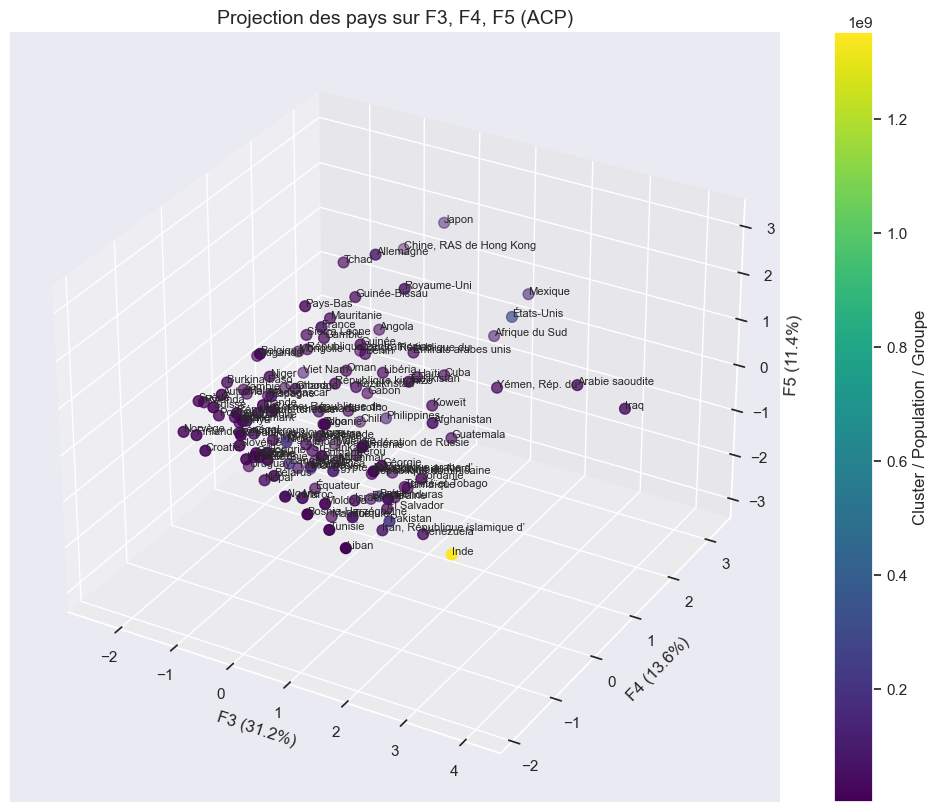

In [45]:
# Projeter les pays sur les 3 premiers axes
X_projected = pca.transform(X_scaled)

display_factorial_3d(X_projected,
                     pca=pca,
                     labels=names,
                     clusters=df_final['Population (2018)'],  # ou None
                     figsize=(14, 10),
                     marker='o')

Le plan est difficilement lisible et interprétable en l'état.

# Etape 3 - Partition des données : Classification hiérarchique (CAH)

La classification hiérarchique permet de créer un arbre qui regroupe les différents individus de façon plus ou moins forte en fonction de la profondeur choisie. On utilise souvent les termes de noeud, de feuille, de parent ou d'enfant pour décrire les liens entre les groupes.

En classification hiérarchique (quand on fait du clustering) :

- un cluster ne peut et ne doit avoir que 2 clusters "enfants"
- un cluster ne peut avoir qu'un seul cluster "parent"

2 approches pour créer une partition hiérarchique :

- Approche ascendante (=clustering agglomératif) : on considère que chaque point est un cluster. Il y a donc autant de clusters que de points. Ensuite, on cherche les 2 clusters les plus proches, et on les agglomère en un seul cluster. On répète cette étape jusqu'à ce que tous les points soient regroupés en un seul grand cluster ;
- Approche descendante (=clustering divisif) : c'est l'inverse. On part d'un grand cluster contenant tous les points, puis on le divise successivement jusqu'à obtenir autant de clusters que de points.

Dendrograme = arbre qui regroupe les différents clusters

Que ce soit avec l'approche ascendante ou descendante, on a besoin de mesurer la distance entre 2 clusters. Il y a plusieurs méthodes de lien (=linkage) qui permettent de garantir que les clusters sont bien séparés  : 
- Lien simple (simple linkage) : on considère que la distance entre 2 clusters est la distance entre leurs 2 points les plus proches.
- Lien complet (complete linkage) : on considère que la distance entre 2 clusters est la distance entre leurs 2 points les plus éloignés.
- Lien moyen : on considère que la distance entre 2 clusters est la moyenne de toutes les distances entre les points d'un cluster et les points de l'autre cluster.
- Lien centroïdal : on considère que la distance entre 2 clusters est la distance entre les centroïdes de ceux-ci.

Par contre on doit aussi s'assurer que les clusters soient resserrés sur eux-mêmes (=inertie intraclasse) : Par défaut, on préfère en général utiliser la méthode de Ward (à chaque itération, càd à chaque fois que 2 clusters sont regroupés en 1, on cherche à minimiser l'augmentation d'inertie intraclasse due au regroupement des 2 clusters).

Le clustering hiérarchique est donc plus adapté aux petits échantillons.

## 3.1 - Classification hiérarchique : Nombre de clusters

In [46]:
# Transformation du dataset de données "X" en DataFrame : 
X = pd.DataFrame(X)

# Application de la méthode .head : 
X.head()

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM)
Zone,,,,,,,,,,,
Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,2.61,3434.071
Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,1.95,5590.381
Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,2.66,1603.534
Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,2.45,1340.390
Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,2.05,6510.322


In [47]:
#Matrice de distance
Z = linkage(X_scaled, method="ward")

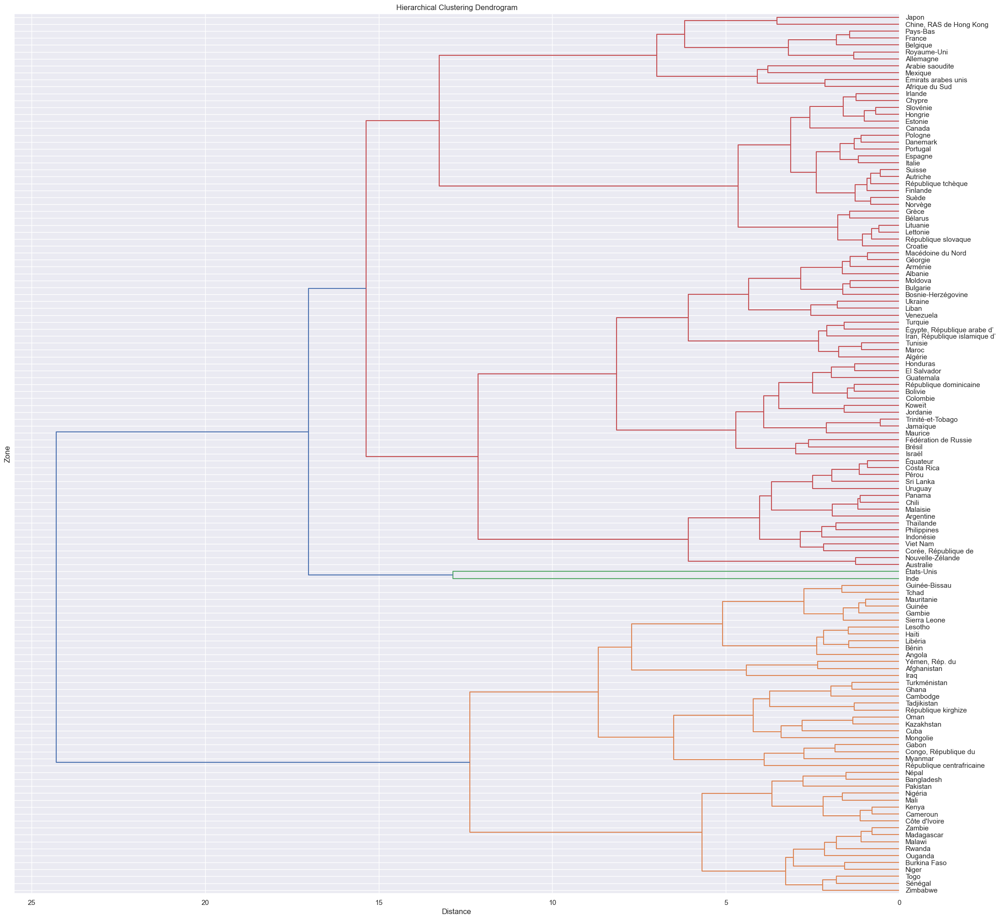

In [48]:
#Affichage du dendrogramme
fig, ax = plt.subplots(1, 1, figsize=(25, 25))

#Si on veut que N clusters affichés (arbre lisible), utiliser arguments p=N, truncate_mode="lastp"
den = dendrogram(Z, ax=ax, orientation = 'left', labels=names)

plt.title('Hierarchical Clustering Dendrogram')
ax.set_xlabel('Distance')
ax.set_ylabel('Zone')
ax.tick_params(axis='x', which='major', labelsize=11)
ax.tick_params(axis='y', which='major', labelsize=11)

Interprétation : 
- On observe 3 couleurs dominantes (orange, vert et rouge) dont le cluster de rouge qui est le plus important
- Si on coupe l'arbre à mi-distance (entre 10 et 15), alors nous distinguons 4 clusters différents (orange, vert et 2 rouges)
- Afin de pouvoir comparer les 2 méthodes (Classification hiérarchique et K-Means), on décide de retenir autant de clusters pour la classification hiérarchique qu'avec le K-Means, à savoir 4 clusters. Cela correspond au nombre de clusters visibles à mi-distance sur notre dendogramme ci-dessus.

## 3.2 - Classification hiérarchique : Visualisation des clusters

On peut utiliser soit Scipy, soit Scikit-Learn. Ici on utilise Avec Scikit-Learn :

In [49]:
#Définition des clusters
cah = AgglomerativeClustering(n_clusters=4, linkage="ward")     #On instancie un estimateur
clusters_den = cah.fit(X_scaled)     #On entraine l'estimateur
cah.labels_    #Regardons nos clusters

array([3, 1, 3, 3, 1, 3, 3, 0, 1, 3, 3, 3, 1, 1, 0, 1, 3, 1, 3, 3, 1, 3,
       1, 0, 1, 0, 3, 0, 3, 3, 3, 0, 0, 0, 3, 1, 1, 0, 3, 1, 0, 3, 1, 1,
       3, 0, 0, 0, 2, 3, 3, 1, 0, 3, 0, 1, 1, 3, 0, 3, 1, 1, 1, 3, 3, 0,
       3, 1, 1, 0, 1, 1, 3, 1, 1, 3, 0, 1, 3, 3, 1, 0, 3, 3, 1, 1, 0, 1,
       3, 0, 3, 3, 0, 0, 1, 1, 1, 3, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 3,
       1, 3, 1, 3, 3, 0, 1, 0, 3, 2, 1, 3, 3, 3, 1, 1, 0], dtype=int64)

Il n'y a pas d'ordre entre les clusters (c'est un ID pas un ordre) : pour que ce soit plus clair on va utiliser des lettres plutôt que des nombres.

In [50]:
dd = {i:j for i,j in enumerate(list("abcd"))}
labels_den = [dd[i] for i in cah.labels_]
labels_den[:10]

['d', 'b', 'd', 'd', 'b', 'd', 'd', 'a', 'b', 'd']

In [51]:
#Ajoutons nos labels à X
X['clusters_den']=labels_den
X.head()

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM),clusters_den
Zone,,,,,,,,,,,,
Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,2.61,3434.071,d
Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,1.95,5590.381,b
Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,2.66,1603.534,d
Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,2.45,1340.390,d
Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,2.05,6510.322,b


In [52]:
#Ajoutons nos labels au dataframe final
df_final_iso3['clusters_den']=labels_den
df_final_iso3.head()

,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den
0,ARM,Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071,d
1,AFG,Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381,b
2,ALB,Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534,d
3,DZA,Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,Algérie,2.45,1340.390,d
4,AGO,Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,Angola,2.05,6510.322,b


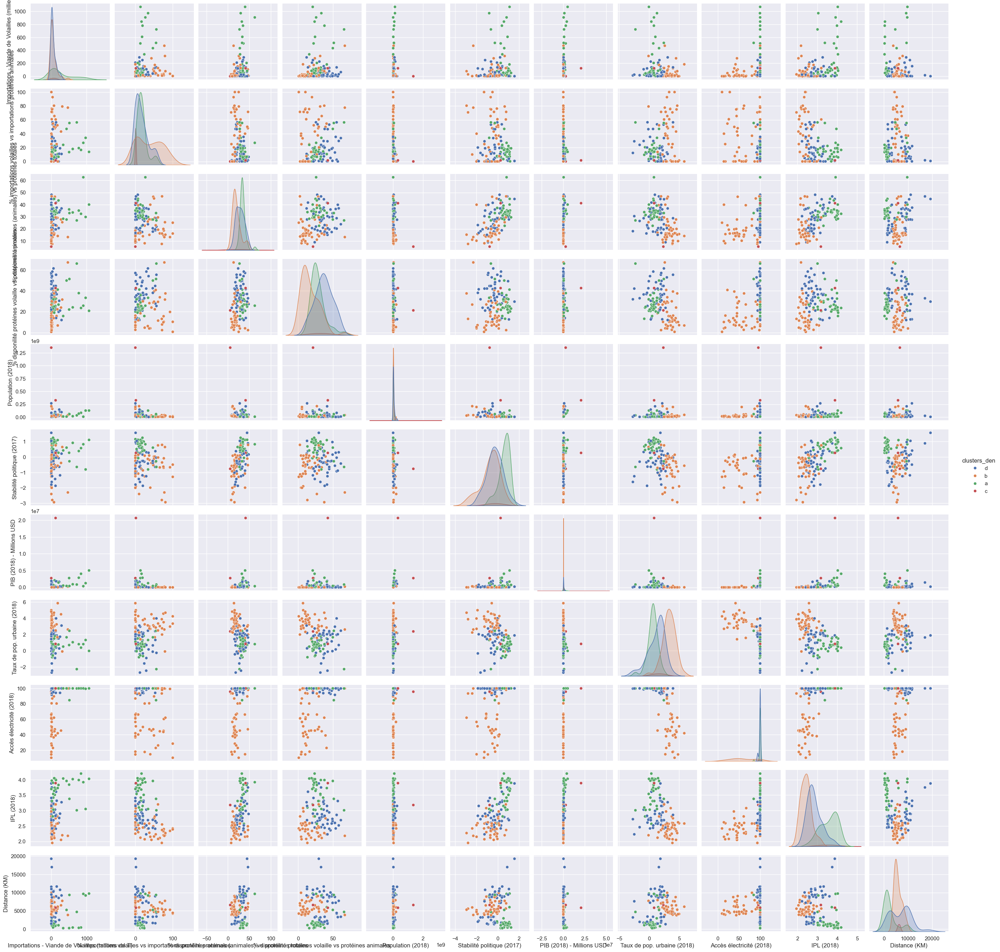

In [53]:
#Observons nos clusters
sns.pairplot(X, hue="clusters_den")

Interprétation : Presque toutes les variables semblent avoir une influence sur la séparation des 4 groupes. On distingue bien 4 clusters isolément dans l'espace.

In [54]:
#Affichage du cluster a
print('le cluster a est composé de',df_final_iso3.loc[df_final_iso3['clusters_den']=='a'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_den']=='a'].Zone.values

le cluster a est composé de 34 pays:


array(['Autriche', 'Canada', 'Chypre', 'Danemark', 'Bélarus', 'Estonie',
       'Finlande', 'France', 'Allemagne', 'Grèce',
       'Chine, RAS de Hong Kong', 'Hongrie', 'Croatie', 'Irlande',
       'Italie', 'Japon', 'Lettonie', 'Lituanie', 'Mexique', 'Pays-Bas',
       'Norvège', 'République tchèque', 'Pologne', 'Portugal',
       'Arabie saoudite', 'Slovénie', 'République slovaque',
       'Afrique du Sud', 'Espagne', 'Suède', 'Suisse',
       'Émirats arabes unis', 'Royaume-Uni', 'Belgique'], dtype=object)

In [55]:
#Affichage du cluster b
print('le cluster b est composé de',df_final_iso3.loc[df_final_iso3['clusters_den']=='b'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_den']=='b'].Zone.values

le cluster b est composé de 45 pays:


array(['Afghanistan', 'Angola', 'Bangladesh', 'Myanmar', 'Cameroun',
       'République centrafricaine', 'Tchad', 'Congo, République du',
       'Cuba', 'Bénin', 'Gabon', 'Gambie', 'Ghana', 'Guinée', 'Haïti',
       'Iraq', "Côte d'Ivoire", 'Kazakhstan', 'République kirghize',
       'Kenya', 'Cambodge', 'Lesotho', 'Libéria', 'Madagascar', 'Malawi',
       'Mali', 'Mauritanie', 'Mongolie', 'Népal', 'Niger', 'Nigéria',
       'Pakistan', 'Guinée-Bissau', 'Zimbabwe', 'Rwanda', 'Sénégal',
       'Sierra Leone', 'Tadjikistan', 'Turkménistan', 'Togo', 'Oman',
       'Ouganda', 'Burkina Faso', 'Yémen, Rép. du', 'Zambie'],
      dtype=object)

In [56]:
#Affichage du cluster c
print('le cluster c est composé de',df_final_iso3.loc[df_final_iso3['clusters_den']=='c'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_den']=='c'].Zone.values

le cluster c est composé de 2 pays:


array(['Inde', 'États-Unis'], dtype=object)

In [57]:
#Affichage du cluster d
print('le cluster d est composé de',df_final_iso3.loc[df_final_iso3['clusters_den']=='d'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_den']=='d'].Zone.values

le cluster d est composé de 46 pays:


array(['Arménie', 'Albanie', 'Algérie', 'Argentine', 'Australie',
       'Bolivie', 'Brésil', 'Bulgarie', 'Sri Lanka', 'Chili', 'Colombie',
       'Costa Rica', 'République dominicaine', 'Équateur',
       'Égypte, République arabe d’', 'El Salvador', 'Géorgie',
       'Bosnie-Herzégovine', 'Guatemala', 'Honduras', 'Indonésie',
       'Iran, République islamique d’', 'Israël', 'Jamaïque', 'Jordanie',
       'Corée, République de', 'Koweït', 'Liban', 'Malaisie', 'Maurice',
       'Maroc', 'Moldova', 'Macédoine du Nord', 'Nouvelle-Zélande',
       'Panama', 'Pérou', 'Philippines', 'Fédération de Russie',
       'Thaïlande', 'Trinité-et-Tobago', 'Tunisie', 'Turquie', 'Ukraine',
       'Uruguay', 'Venezuela', 'Viet Nam'], dtype=object)

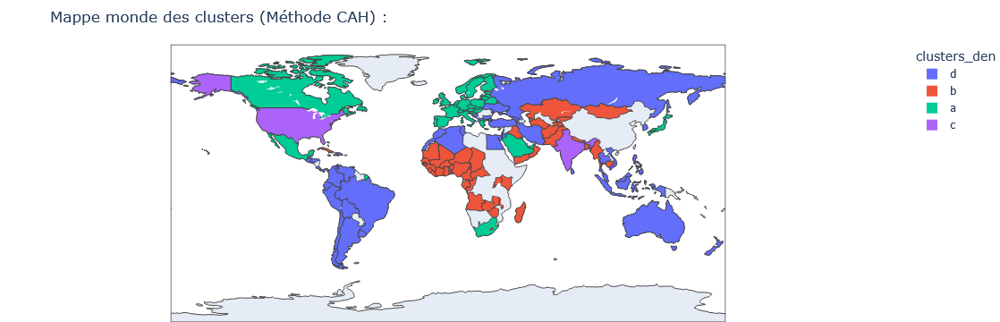

In [58]:
#Mappemonde colorimétrique représentant les pays par leur cluster associé (CAH)

import plotly.express as px #import de la librairie

fig = px.choropleth(df_final_iso3, locations="Code Zone_ISO3",
                    color="clusters_den",
                    hover_name="Zone", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma,
                   )
fig.update_layout(title_text='Mappe monde des clusters (Méthode CAH) :', margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

Remarques concernant les emplacements géographiques selon les clusters :

- Cluster "a" : Essentiellement les pays d'Europe, Canada, Mexique, Arabie Saoudite et Afrique du Sud
- Cluster "b" : Essentiellement les pays d'Afrique et quelques pays d'Orient et Asie
- Cluster "c" : Inde et les Etats-Unis
- Cluster "d" : Toute l'Amérique du Sud, l'Océanie, quelques pays d'Afrique du Nord, Russie et Ukraine

## 3.3 - Classification hiérarchique : Visualisation par les centroïdes

In [59]:
df_final_iso3.head(3)

,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den
0,ARM,Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071,d
1,AFG,Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381,b
2,ALB,Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534,d


In [60]:
#Création nouveau dataframe sans colonnes "Zone" et "Code Zone_ISO3" pour avoir que les colonnes de données quantitatives
df_final_iso3_quanti = df_final_iso3.copy()

In [61]:
df_final_iso3_quanti.head()

,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den
0,ARM,Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071,d
1,AFG,Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381,b
2,ALB,Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534,d
3,DZA,Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,Algérie,2.45,1340.390,d
4,AGO,Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,Angola,2.05,6510.322,b


In [62]:
#Création nouveau dataframe sans colonnes "Zone" et "Code Zone_ISO3" pour avoir que les colonnes de données quantitatives
df_final_iso3_quanti.drop('Zone', axis=1, inplace=True)
df_final_iso3_quanti.drop('Code Zone_ISO3', axis=1, inplace=True)
df_final_iso3_quanti.head(3)

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den
0,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071,d
1,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381,b
2,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534,d


In [63]:
#Calcul des moyennes de chaque variable via groupby clusters
df_centroids_den = (
    df_final_iso3_quanti
    .groupby('clusters_den')
    .mean(numeric_only=True)
    .round(2)
)
display(df_centroids_den)

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM)
clusters_den,,,,,,,,,,,
a,273.79,17.39,34.25,28.52,2.665762e+07,0.60,878123.68,0.58,99.51,3.58,2532.44
b,57.94,38.09,20.23,17.37,2.877142e+07,-0.70,57199.36,3.31,59.62,2.43,5841.72
c,61.51,0.76,23.28,31.95,8.398693e+08,-0.26,11710025.49,1.60,97.85,3.54,6216.19
d,56.15,16.69,28.58,36.53,3.792521e+07,-0.28,315535.91,1.22,98.81,2.85,6924.68


Cluster a : Paraît être le cluster le plus intéressant pour le développement de notre activité à l'étranger

- Plus forte quantité en importation de volailles en valeur
- Meilleure stabilité politique (indice >0)
- Meilleur IPL + accès à l'électrcité
- Pays les plus proches de la France
- Taux de pop. urbaine le plus faible et croissance de la population la plus faible de tous les clusters

Cluster d : Quantités de volailles importées beaucoup trop faibles en valeur

- Plus faible quantité en importation de volailles en valeur
- Stabilité politique moyenne
- IPL + accès à l'électrcité raisonnables
- Pays les plus éloignés de la France
- Taux de pop. urbaine moyenne et croissance de la population moyenne

Cluster b : Quantités de volailles importées beaucoup trop faibles en valeur

- Quantités moyennes d'importation de volailles en valeur
- Stabilité politique moyenne
- IPL + accès à l'électrcité raisonnables
- Pays assez éloignés de la France
- Taux de pop. urbaine moyenne et croissance de la population moyenne
- Cluster comportant le plus grand nombre d'habitants et le PIB le plus important

Cluster c : Quantités de volailles importées beaucoup trop faibles en valeur malgré un nombre d'habitant important et une croissance de la population la plus forte, et malgré une dépendance forte en importations de volailles

- Quantités moyennes d'importation de volailles en valeur
- Indice de stabilité politique le plus faible
- IPL + accès à l'électricité les plus bas parmis tous les clusters
- Pays assez éloignés de la France
- Taux de pop. urbaine moyenne et croissance de la population les plus élevés

A la lecture des éléments précédents, nous allons retenir le cluster a avec la méthode de la classification hiérarchique.

In [64]:
# Création automatique du DataFrame projeté en PCA
n_components = X_proj.shape[1]  # Nombre réel de composantes dans la projection
df_X_proj = pd.DataFrame(X_proj, columns=[f"F{i+1}" for i in range(n_components)])

# Affichage des 5 premières lignes pour vérification
df_X_proj.head()

,F1,F2,F3,F4,F5,F6,F7
0,-0.262336,-1.138261,1.044728,-0.621358,0.300106,0.296502,0.984742
1,-3.611849,-0.037990,1.694726,0.139905,0.440313,-0.283062,0.493143
2,-0.223318,-1.137686,0.512077,-0.758350,0.705586,0.454669,0.884853
3,-1.302202,0.359061,0.638815,-1.819170,0.082719,-0.349044,-0.581750
4,-2.083701,-0.109164,-0.329079,1.602040,0.612195,-0.058178,-0.288883


In [65]:
#Calcul des coordonnées de nos individus dans le nouvel espace
X_proj = pca.transform(X_scaled)
X_proj[:5]

#Dataframe représentant les projections dans le nouvel espace d'axes d'inertie
df_X_proj = pd.DataFrame(X_proj, columns=["F1", "F2", "F3", "F4", "F5", "F6", "F7"])

Centroïdes => projection dans le "nouvel espace" des cercles de corrélation :

In [66]:
#Scalons les centroïdes avant de les calculer
std_scale = StandardScaler()
centroids_den_scaled = std_scale.fit_transform(df_centroids_den)

# et on utilise l'ACP déjà entrainée : 
centroids_den_proj = pca.transform(centroids_den_scaled)

# Création d'un dataframe pour plus de clarté:
df_centroids_den_proj = pd.DataFrame(centroids_den_proj, columns = ["F1", "F2", "F3", "F4", "F5", "F6", "F7"], index=["cluster_a", "cluster_b", "cluster_c", "cluster_d"])
print('Projection des centroïdes : Méthode de la Classification hiérarchique')
df_centroids_den_proj

Projection des centroïdes : Méthode de la Classification hiérarchique


,F1,F2,F3,F4,F5,F6,F7
cluster_a,2.691494,-1.364769,-0.602768,-0.268502,1.613792,-0.698304,0.126905
cluster_b,-3.776635,-0.324731,-0.653775,0.606259,0.794387,0.137982,0.319881
cluster_c,0.931745,2.642531,0.733798,-0.542909,-0.720906,0.493625,-0.263898
cluster_d,0.153396,-0.953031,0.522746,0.205152,-1.687273,0.066698,-0.182887


Projection des clusters sur 2 dimensions (F1, F2) :

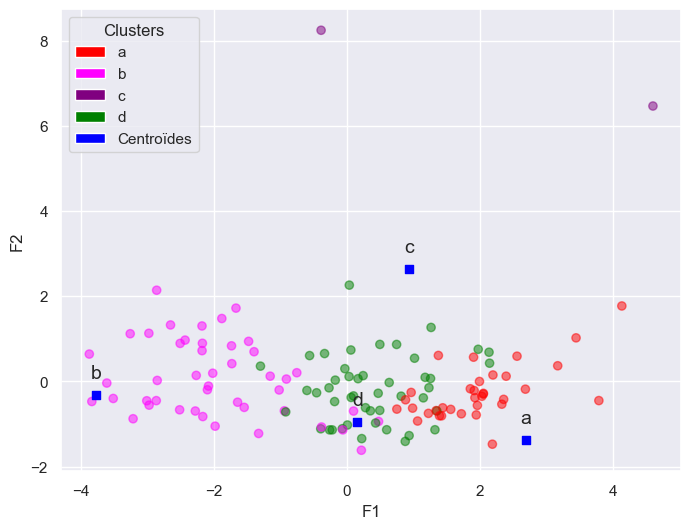

In [67]:
#Projection des clusters sur 2 dimensions (F1, F2) :

#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded_den = label_encoder.fit_transform(labels_den)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_den_str = label_encoder.inverse_transform(labels_encoded_den)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_den_str]

# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,6))

# Affichage des pays, avec une transparence (alpha) et on colorie les points en fonction de leurs labels : 
ax.scatter(df_X_proj.iloc[:, 0], df_X_proj.iloc[:, 1], c= point_colors, alpha =0.5)

# Affichage des centroides, avec une couleur et une forme de carré (marker="s") : 
ax.scatter(df_centroids_den_proj.iloc[:, 0], df_centroids_den_proj.iloc[:, 1], marker="s", c="blue", label="Centroïdes")

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_den.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_den_proj.iloc[i, 0]
    y = df_centroids_den_proj.iloc[i, 1]
    ax.text(x, y + 0.3, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable


# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# On spécifie les axes x et y :
ax.set_xlabel("F1")
ax.set_ylabel("F2")
plt.show()

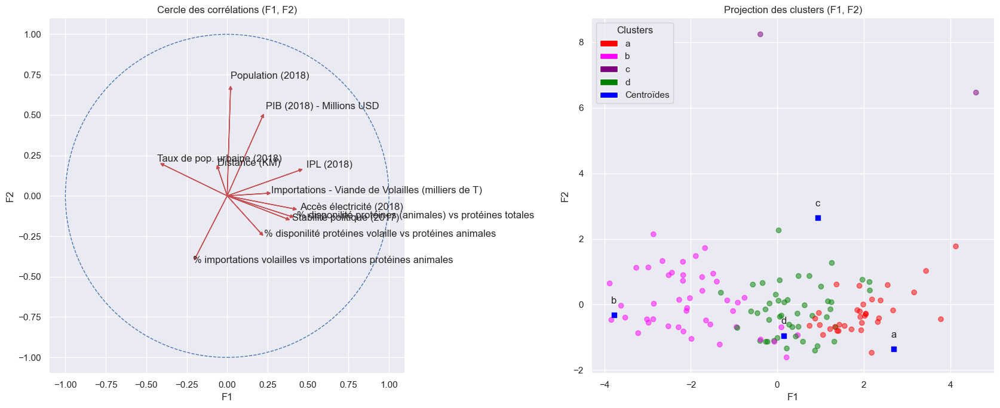

In [68]:
#Affichage simultané => Cercle de corrélations F1/F2 et Projection des clusters sur dimensions (F1, F2) :


# 1/ Fonction modifiée pour tracer dans un axe donné
def correlation_graph(pca, x_y, features, ax):
    pcs = pca.components_
    for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
        ax.arrow(0, 0, x, y, head_width=0.02, head_length=0.02, fc='r', ec='r')
        ax.text(x * 1.1, y * 1.1, features[i], fontsize=12)

    # Cercle unité
    circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b', linestyle='--')
    ax.add_patch(circle)

    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel("F1")
    ax.set_ylabel("F2")
    ax.set_aspect('equal')
    ax.grid(True) #Afficher le quadrillage sinon le retire par défaut
    ax.set_title("Cercle des corrélations (F1, F2)")


# 2/ Création de la figure avec 2 sous-graphiques

fig, axs = plt.subplots(1, 2, figsize=(17, 7))  # 1 ligne, 2 colonnes

# Graphique 1 : Cercle des corrélations
correlation_graph(pca, x_y, features, ax=axs[0])

# Graphique 2 : Projection des clusters
# Encodage des labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels_den)
labels_encoded_den_str = label_encoder.inverse_transform(labels_encoded_den)

# Couleurs des points selon les clusters
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}
point_colors = [custom_colors[label] for label in labels_encoded_den_str]


# Affichage des points et centroïdes
axs[1].scatter(df_X_proj.iloc[:, 0], df_X_proj.iloc[:, 1], c=point_colors, alpha=0.5)
axs[1].scatter(df_centroids_den_proj.iloc[:, 0], df_centroids_den_proj.iloc[:, 1], marker="s", c="blue", label="Centroïdes")


# Noms des centroïdes
for i, cluster_name in enumerate(df_centroids_den.index):
    x = df_centroids_den_proj.iloc[i, 0]
    y = df_centroids_den_proj.iloc[i, 1]
    axs[1].text(x, y + 0.3, cluster_name, fontsize=12, ha='center', va='bottom')

# Légende
legend_elements = [Patch(facecolor=custom_colors[label], label=label) for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))
axs[1].legend(handles=legend_elements, title="Clusters")


# Titres et axes
axs[1].set_title("Projection des clusters (F1, F2)")
axs[1].set_xlabel("F1")
axs[1].set_ylabel("F2")

plt.tight_layout()
plt.show()

Interprétation du plan F1/F2 : 
- Les clusters sont facilement identifiables à l'oeil nu (inertie inter-classe maximisée), ils sont par ailleurs assez ressérés sur eux-mêmes (inertie intra-classe minimisée)
- Pour notre développement à l'international, on devrait se concentrer sur les pays situés dans la zone avec une composante F1 max (IPL, accès éléctricité, stabilité politique) et une composante F2 autour de 0 (population, PIB et % importations volailles influençant F2 dans le sens inverse) : cela correspond au cluster a.

Projection des clusters sur 2 dimensions (F3, F4) :

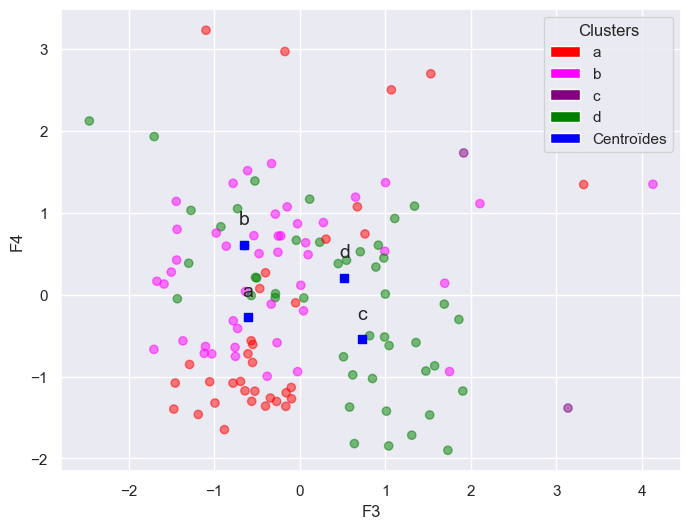

In [69]:
#Projection des clusters sur 2 dimensions (F3, F4) :

#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded_den = label_encoder.fit_transform(labels_den)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_den_str = label_encoder.inverse_transform(labels_encoded_den)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_den_str]

# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,6))

# Affichage des pays, avec une transparence (alpha) et on colorie les points en fonction de leurs labels : 
ax.scatter(df_X_proj.iloc[:, 2], df_X_proj.iloc[:, 3], c= point_colors, alpha =0.5)

# Affichage des centroides, avec une couleur et une forme de carré (marker="s") : 
ax.scatter(df_centroids_den_proj.iloc[:, 2], df_centroids_den_proj.iloc[:, 3], marker="s", c="blue", label="Centroïdes")

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_den.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_den_proj.iloc[i, 2]
    y = df_centroids_den_proj.iloc[i, 3]
    ax.text(x, y + 0.2, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# On spécifie les axes x et y :
ax.set_xlabel("F3")
ax.set_ylabel("F4")
plt.show()

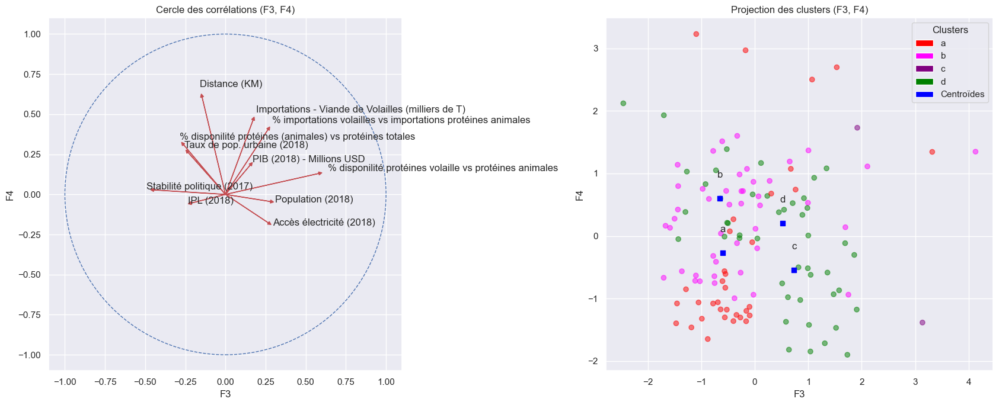

In [70]:
#Affichage simultané => Cercle de corrélations F3/F4 et Projection des clusters sur dimensions (F3, F4) :


# 1/ Fonction modifiée pour tracer dans un axe donné
def correlation_graph(pca, x_y, features, ax):
    pcs = pca.components_
    for i, (x, y) in enumerate(zip(pcs[2, :], pcs[3, :])):
        ax.arrow(0, 0, x, y, head_width=0.02, head_length=0.02, fc='r', ec='r')
        ax.text(x * 1.1, y * 1.1, features[i], fontsize=12)

    # Cercle unité
    circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b', linestyle='--')
    ax.add_patch(circle)

    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel("F3")
    ax.set_ylabel("F4")
    ax.set_aspect('equal')
    ax.grid(True) #Afficher le quadrillage sinon le retire par défaut
    ax.set_title("Cercle des corrélations (F3, F4)")


# 2/ Création de la figure avec 2 sous-graphiques

fig, axs = plt.subplots(1, 2, figsize=(17, 7))  # 1 ligne, 2 colonnes

# Graphique 1 : Cercle des corrélations
correlation_graph(pca, (2,3), features, ax=axs[0])

# Graphique 2 : Projection des clusters
# Encodage des labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels_den)
labels_encoded_den_str = label_encoder.inverse_transform(labels_encoded_den)

# Couleurs des points selon les clusters
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}
point_colors = [custom_colors[label] for label in labels_encoded_den_str]


# Affichage des points et centroïdes
axs[1].scatter(df_X_proj.iloc[:, 2], df_X_proj.iloc[:, 3], c=point_colors, alpha=0.5)
axs[1].scatter(df_centroids_den_proj.iloc[:, 2], df_centroids_den_proj.iloc[:, 3], marker="s", c="blue", label="Centroïdes")


# Noms des centroïdes
for i, cluster_name in enumerate(df_centroids_den.index):
    x = df_centroids_den_proj.iloc[i, 2]
    y = df_centroids_den_proj.iloc[i, 3]
    axs[1].text(x, y + 0.3, cluster_name, fontsize=12, ha='center', va='bottom')

# Légende
legend_elements = [Patch(facecolor=custom_colors[label], label=label) for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))
axs[1].legend(handles=legend_elements, title="Clusters")


# Titres et axes
axs[1].set_title("Projection des clusters (F3, F4)")
axs[1].set_xlabel("F3")
axs[1].set_ylabel("F4")

plt.tight_layout()
plt.show()

Interprétation du plan F3/F4 : 
- Cette fois-ci les clusters sont moins facilement identifiables à l'oeil nu car beaucoup plus étalés (l'algortithme a eu du mal à minimiser l'inertie intra-classe). Les différents clusters ne sont pas si éloignés que ça sur le plan et leurs points se superposent (l'inertie inter-classe n'a pas pu être maximisée)
- Pour cette projection 2D, les centroïdes nous aident à situer à distinguer les clusters.
- Pour notre développement à l'international, on devrait se concentrer sur les pays situés dans la zone avec une composante F3 négative (IPL, stabilité politique) et une composante F4 probablement positive (importations, distance) : les clusters d correspond (on remarque néanmoins que le centroïde du cluster a en est proche).

Projection des clusters sur 2 dimensions (F4, F5) :

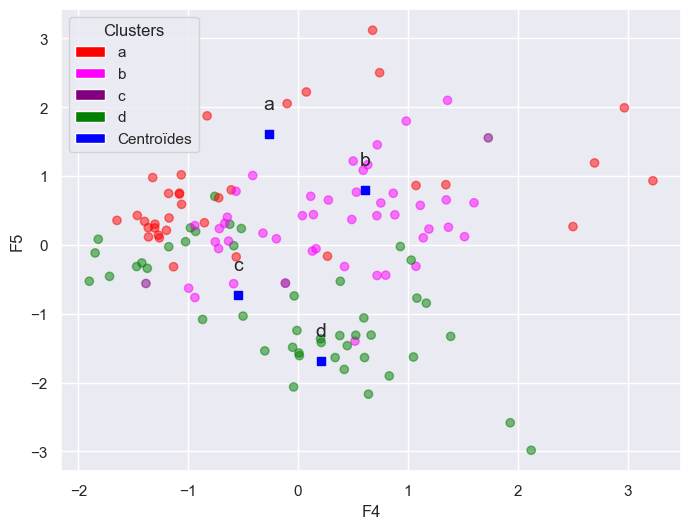

In [71]:
#Projection des clusters sur 2 dimensions (F4, F5) :

#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded_den = label_encoder.fit_transform(labels_den)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_den_str = label_encoder.inverse_transform(labels_encoded_den)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_den_str]

# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,6))

# Affichage des pays, avec une transparence (alpha) et on colorie les points en fonction de leurs labels : 
ax.scatter(df_X_proj.iloc[:, 3], df_X_proj.iloc[:, 4], c= point_colors, alpha =0.5)

# Affichage des centroides, avec une couleur et une forme de carré (marker="s") : 
ax.scatter(df_centroids_den_proj.iloc[:, 3], df_centroids_den_proj.iloc[:, 4], marker="s", c="blue", label="Centroïdes")

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_den.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_den_proj.iloc[i, 3]
    y = df_centroids_den_proj.iloc[i, 4]
    ax.text(x, y + 0.3, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# On spécifie les axes x et y :
ax.set_xlabel("F4")
ax.set_ylabel("F5")
plt.show()

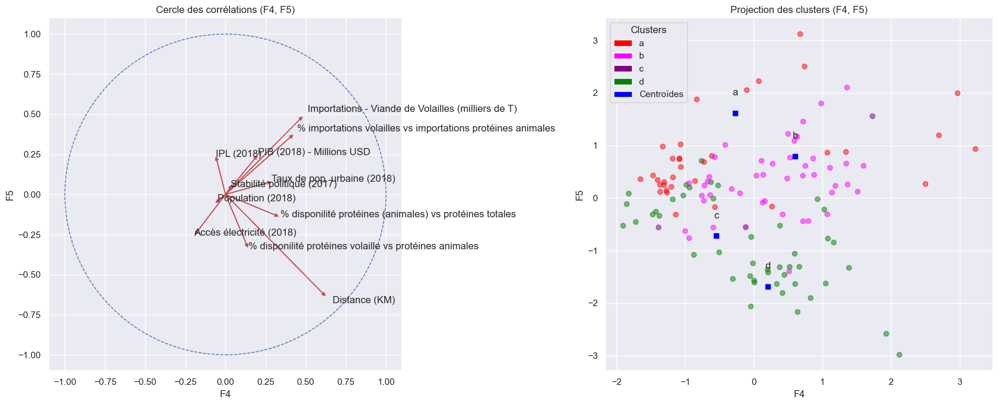

In [72]:
#Affichage simultané => Cercle de corrélations F4/F5 et Projection des clusters sur dimensions (F4, F5) :


# 1/ Fonction modifiée pour tracer dans un axe donné
def correlation_graph(pca, x_y, features, ax):
    pcs = pca.components_
    for i, (x, y) in enumerate(zip(pcs[3, :], pcs[4, :])):
        ax.arrow(0, 0, x, y, head_width=0.02, head_length=0.02, fc='r', ec='r')
        ax.text(x * 1.1, y * 1.1, features[i], fontsize=12)

    # Cercle unité
    circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b', linestyle='--')
    ax.add_patch(circle)

    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel("F4")
    ax.set_ylabel("F5")
    ax.set_aspect('equal')
    ax.grid(True) #Afficher le quadrillage sinon le retire par défaut
    ax.set_title("Cercle des corrélations (F4, F5)")


# 2/ Création de la figure avec 2 sous-graphiques

fig, axs = plt.subplots(1, 2, figsize=(17, 7))  # 1 ligne, 2 colonnes

# Graphique 1 : Cercle des corrélations
correlation_graph(pca, (3,4), features, ax=axs[0])

# Graphique 2 : Projection des clusters
# Encodage des labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels_den)
labels_encoded_den_str = label_encoder.inverse_transform(labels_encoded_den)

# Couleurs des points selon les clusters
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}
point_colors = [custom_colors[label] for label in labels_encoded_den_str]


# Affichage des points et centroïdes
axs[1].scatter(df_X_proj.iloc[:, 3], df_X_proj.iloc[:, 4], c=point_colors, alpha=0.5)
axs[1].scatter(df_centroids_den_proj.iloc[:, 3], df_centroids_den_proj.iloc[:, 4], marker="s", c="blue", label="Centroïdes")


# Noms des centroïdes
for i, cluster_name in enumerate(df_centroids_den.index):
    x = df_centroids_den_proj.iloc[i, 3]
    y = df_centroids_den_proj.iloc[i, 4]
    axs[1].text(x, y + 0.3, cluster_name, fontsize=12, ha='center', va='bottom')

# Légende
legend_elements = [Patch(facecolor=custom_colors[label], label=label) for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))
axs[1].legend(handles=legend_elements, title="Clusters")


# Titres et axes
axs[1].set_title("Projection des clusters (F4, F5)")
axs[1].set_xlabel("F4")
axs[1].set_ylabel("F5")

plt.tight_layout()
plt.show()

Interprétation du plan F4/F5 : 
- Sur cette projection, même si les clusters ne sont pas très ressérés sur eux-mêmes, on arrive à distinguer visuellement les clusters les uns des autres car ils se démarquent sur le plan.
- Pour notre développement à l'international, on devrait se concentrer sur les pays situés dans la zone avec une composante F4 probablement positive ou proche de 0 (importations, distance) et une composante F5 probablement positive (importations et distance inluençant F5 négativement) : le cluster d apparaît être le plus pertinent (on remarque néanmoins que le centroïde du cluster a en est proche).

Projection des clusters sur 3 dimensions (F3, F4, F5) :

Text(0.5, 0, 'F5')

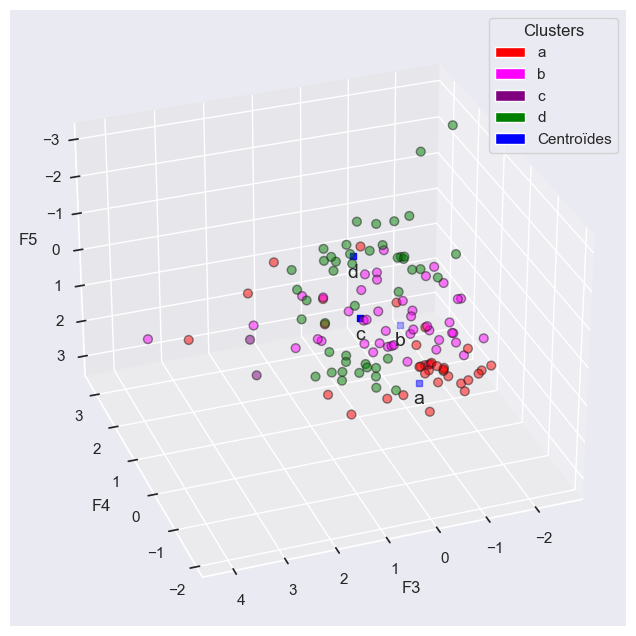

In [73]:
# Projection des clusters sur 3 dimensions (F3, F4, F5) :

# Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded_den = label_encoder.fit_transform(labels_den)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_den_str = label_encoder.inverse_transform(labels_encoded_den)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_den_str]

# On définit notre figure et notre axe différemment : 
fig= plt.figure(1, figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

# Affichage des pays
ax.scatter(df_X_proj.iloc[:, 2], df_X_proj.iloc[:, 3], df_X_proj.iloc[:, 4], c=point_colors, edgecolor="k", s=40, alpha =0.5)

# Affichage des centroides, avec une couleur noire (c="black") et une forme de carré (marker="s") : 
ax.scatter(df_centroids_den_proj.iloc[:, 2], df_centroids_den_proj.iloc[:, 3], df_centroids_den_proj.iloc[:, 4],  marker="s", c="blue" )

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_den.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_den_proj.iloc[i, 2]
    y = df_centroids_den_proj.iloc[i, 3]
    z = df_centroids_den_proj.iloc[i, 4]
    ax.text(x, y, z + 0.7, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# Nom des axes
ax.set_xlabel("F3")
ax.set_ylabel("F4")
ax.set_zlabel("F5")

# Etape 4 - Partition des données : Algorithme K-Means

On veut que les groupes (=clusters) soient :
- Resserrés sur eux-mêmes : 2 points qui sont proches devraient appartenir au même groupe => minimiser la variance intraclasse
- Loin les uns des autres, c'est-à-dire qu'ils soient fortement différenciés => maximiser la variance interclasse

Centroïde : centre de gravité du cluster (individu théorique moyen du cluster)

Méthode K-Means : 
- On veut déterminer combien de groupes on souhaite trouver (K)
- On place aléatoirement dans l'espace les centres de gravité des groupes (centroïdes)
- Une fois les centroïdes placés, on prend chaque point du nuage et on lui associe le cluster du centroïde dont il est le plus proche. On obtient donc un nuage de points dont chaque point appartient à l'un des K groupes.
- On calcule le centre de gravité de chaque groupe (On déplace donc ce centroïde sur le nouveau centre de gravité calculé)
- Comme le centroïde a bougé, il faut recalculer, pour chacun des points du nuage, quel est le centroïde le plus proche, pour l'associer au bon cluster
- On continue jusqu'à la convergence de l'algorithme (= quand centroïde reste immobile après avoir recalculé pour chaque point son cluster)
- Note : L'algorithme du k-means converge en général très rapidement (environ 10 itérations)

## 4.1 - K-Means : Nombre de clusters (Méthode du coude)

Avec la méthode du K-means, nous ne savons pas d'avance quel est le nombre optimal de clusters pour la partition. Nous allons donc au préalable générer un graphique qui nous permettra visuellement d'opter pour un nombre de clusters indiqué par une "cassure" dans la courbe ("Méthode du coude") : 
- Soit x : le nombre de clusters (variable "n_cluster")
- Soit y : la liste des inerties intraclasses (variable "inertia")

In [74]:
X.head()

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM),clusters_den
Zone,,,,,,,,,,,,
Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,2.61,3434.071,d
Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,1.95,5590.381,b
Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,2.66,1603.534,d
Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,2.45,1340.390,d
Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,2.05,6510.322,b


In [75]:
#Suppression colonne "clusters_den"
X.drop('clusters_den', axis=1, inplace=True)
X.head()

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM)
Zone,,,,,,,,,,,
Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,2.61,3434.071
Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,1.95,5590.381
Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,2.66,1603.534
Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,2.45,1340.390
Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,2.05,6510.322


In [76]:
# Définition d'une liste vide pour enregistrer les inerties :  
inertia_list = [ ]

# Liste de nombres de clusters qu'on veut tester : 
k_list = range(1, 10)

# Pour chaque nombre de clusters : 
for k in k_list : 
    
    # On instancie un K-Means pour k clusters
    kmeans = KMeans(n_clusters=k)
    
    # On entraine le modèle K-Means sur les données du dataset "X"
    kmeans.fit(X)
    
    # On enregistre l'inertie obtenue (=mesure à quel point les points sont proches de leur centroïde dans chaque cluster) : 
    inertia_list.append(kmeans.inertia_)

In [77]:
#On obtient une liste d'inerties
inertia_list

[2.0828464657042985e+18,
 3.574814891760501e+17,
 9.964656012794835e+16,
 4.715400861059388e+16,
 2.705427276967047e+16,
 1.5527669926883194e+16,
 1.1049573607756706e+16,
 7276468519281782.0,
 5212249250741093.0]

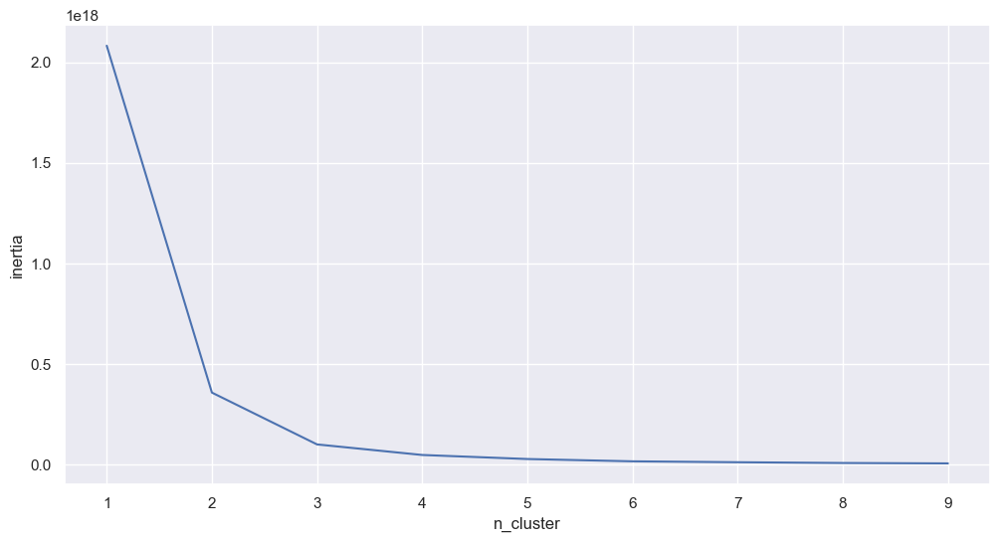

In [78]:
#Affichage courbe des inerties pour repérer le "coude"
fig, ax = plt.subplots(1,1,figsize=(12,6))

ax.set_ylabel("inertia")
ax.set_xlabel("n_cluster")
ax = plt.plot(k_list, inertia_list)

Résultat : La cassure la plus forte se situe à partir de 4 clusters, donc nous partirons sur un nombre total de 4 clusters pour la suite de l'analyse.

## 4.2 - K-Means : Visualisation des clusters

In [79]:
#On ré-entraîne un estimateur pour un nombre optimal de 4 clusters
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)

KMeans(n_clusters=4)

In [80]:
#Les clusters en question
labels = kmeans.labels_
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 3, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 2, 0, 0, 2, 0, 3, 0, 0, 0, 2, 0, 0, 0])

In [81]:
#Il n'y a pas d'ordre entre les clusters (c'est un ID pas un ordre) : pour que ce soit plus clair on va utiliser des lettres plutôt que des nombres
dd = {i:j for i,j in enumerate(list("abcd"))}
dd

{0: 'a', 1: 'b', 2: 'c', 3: 'd'}

In [82]:
labels = [dd[i] for i in kmeans.labels_]
labels[:10]

['a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'c', 'a']

In [83]:
#Ajout des labels a, b, c au dataset X
X["cluster_kmeans"] = labels
X

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM),cluster_kmeans
Zone,,,,,,,,,,,,
Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,2.61,3434.0710,a
Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,1.95,5590.3810,a
Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,2.66,1603.5340,a
Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,2.45,1340.3900,a
Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,2.05,6510.3220,a
...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,25.0,29.07,30.52,42.08,28887118,-1.25,203126.902526,-2.481954,99.9,2.23,7618.8600,a
Viet Nam,291.0,10.80,36.87,12.08,95545962,0.21,310106.478468,3.093022,100.0,3.27,9208.5540,c
"Yémen, Rép. du",78.0,80.41,15.23,37.48,28498683,-2.93,26671.579499,4.683561,62.0,2.27,5317.2610,a


In [84]:
#Ajout de la colonne avec le n° de clusters issu du k-means
df_final_iso3['clusters_kmeans'] = labels
df_final_iso3.head()

,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den,clusters_kmeans
0,ARM,Arménie,35.0,56.45,21.89,25.53,2951745,-0.63,12457.940705,-0.276806,99.9,Arménie,2.61,3434.071,d,a
1,AFG,Afghanistan,29.0,70.73,7.58,13.17,37171921,-2.79,18856.319311,3.876433,93.4,Afghanistan,1.95,5590.381,b,a
2,ALB,Albanie,38.0,53.52,18.79,27.88,2882740,0.37,15156.427728,1.317162,100.0,Albanie,2.66,1603.534,d,a
3,DZA,Algérie,2.0,1.67,8.95,23.71,42228408,-0.92,174910.894611,2.735427,99.6,Algérie,2.45,1340.390,d,a
4,AGO,Angola,277.0,43.08,27.75,23.98,30809787,-0.39,101353.211188,4.488892,45.3,Angola,2.05,6510.322,b,a


In [85]:
#Redéfinir la colonne "Zone" comme une colonne classique (non index)
df_final_iso3.reset_index(inplace=True)

#Affichage du cluster a:
print('le cluster a est composé de',df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='a'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='a'].Zone.values

le cluster a est composé de 106 pays:


array(['Arménie', 'Afghanistan', 'Albanie', 'Algérie', 'Angola',
       'Argentine', 'Australie', 'Autriche', 'Bolivie', 'Bulgarie',
       'Myanmar', 'Cameroun', 'Canada', 'République centrafricaine',
       'Sri Lanka', 'Tchad', 'Chili', 'Colombie', 'Congo, République du',
       'Costa Rica', 'Cuba', 'Chypre', 'Bénin', 'Danemark',
       'République dominicaine', 'Bélarus', 'Équateur', 'El Salvador',
       'Estonie', 'Finlande', 'Géorgie', 'Gabon', 'Gambie',
       'Bosnie-Herzégovine', 'Ghana', 'Grèce', 'Guatemala', 'Guinée',
       'Haïti', 'Honduras', 'Chine, RAS de Hong Kong', 'Hongrie',
       'Croatie', 'Iraq', 'Irlande', 'Israël', "Côte d'Ivoire",
       'Kazakhstan', 'Jamaïque', 'Jordanie', 'République kirghize',
       'Kenya', 'Cambodge', 'Corée, République de', 'Koweït', 'Lettonie',
       'Liban', 'Lesotho', 'Libéria', 'Lituanie', 'Madagascar', 'Malawi',
       'Malaisie', 'Mali', 'Mauritanie', 'Maurice', 'Mongolie', 'Maroc',
       'Moldova', 'Népal', 'Pays-Bas', 'Macé

In [86]:
#Affichage - Cluster a
cluster_a = df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='a']
cluster_a.sort_values(by='Population (2018)', ascending=False)

,index,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den,clusters_kmeans
12,12,MMR,Myanmar,3.000,7.69,39.51,26.93,53708320,-1.08,6.925666e+04,1.568429,66.1,Myanmar,2.30,8892.726,b,a
61,61,KEN,Kenya,0.075,0.00,13.73,2.75,51392565,-1.13,9.220298e+04,3.777408,61.2,Kenya,2.81,6491.402,b,a
63,63,KOR,"Corée, République de",137.000,3.99,41.69,14.05,51171706,0.38,1.824251e+06,0.379519,100.0,"Corée, République de",3.61,8981.467,d,a
19,19,COL,Colombie,78.000,16.28,29.68,44.59,49661048,-0.78,3.341982e+05,2.250987,98.5,Colombie,2.94,8707.677,d,a
104,104,ESP,Espagne,205.000,6.66,43.46,26.82,46692858,0.27,1.431643e+06,0.752070,100.0,Espagne,3.83,1054.656,a,a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,94,GNB,Guinée-Bissau,4.000,100.00,16.16,10.38,1874303,-0.50,1.427473e+03,3.335714,28.4,Guinée-Bissau,2.39,4440.633,b,a
111,111,TTO,Trinité-et-Tobago,23.000,35.38,36.40,53.96,1389843,0.27,2.388891e+04,0.148961,100.0,Trinité-et-Tobago,2.42,7225.325,d,a
31,31,EST,Estonie,21.000,17.80,22.54,30.07,1322920,0.64,3.122263e+04,0.584963,100.0,Estonie,3.31,1859.091,a,a
75,75,MUS,Maurice,2.000,0.94,30.05,49.15,1267185,0.96,1.473567e+04,-0.062932,99.8,Maurice,2.73,9422.744,d,a


In [87]:
#Affichage du cluster b:
print('le cluster b est composé de',df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='b'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='b'].Zone.values

le cluster b est composé de 1 pays:


array(['Inde'], dtype=object)

In [88]:
#Affichage - Cluster b
cluster_b = df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='b']
cluster_b.sort_values(by='Population (2018)', ascending=False)

,index,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den,clusters_kmeans
48,48,IND,Inde,0.018,0.0,5.36,21.31,1352642280,-0.77,2.763535e+06,2.368941,95.7,Inde,3.18,6594.23,c,b


In [89]:
#Affichage du cluster c:
print('le cluster c est composé de',df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='c'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='c'].Zone.values

le cluster c est composé de 15 pays:


array(['Bangladesh', 'Égypte, République arabe d’', 'France', 'Allemagne',
       'Iran, République islamique d’', 'Italie', 'Japon', 'Mexique',
       'Philippines', 'Fédération de Russie', 'Afrique du Sud',
       'Thaïlande', 'Turquie', 'Royaume-Uni', 'Viet Nam'], dtype=object)

In [90]:
#Affichage - Cluster c
cluster_c = df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='c']
cluster_c.sort_values(by='Population (2018)', ascending=False)

,index,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den,clusters_kmeans
8,8,BGD,Bangladesh,28.779,0.00,14.66,5.32,161376708,-1.25,3.162056e+05,2.956502,86.9,Bangladesh,2.58,7916.7900,b,c
97,97,RUS,Fédération de Russie,226.000,11.04,33.66,30.45,145734038,-0.64,1.657329e+06,0.261747,100.0,Fédération de Russie,2.76,2494.3160,d,c
58,58,JPN,Japon,1069.000,13.80,40.05,20.89,127202192,1.10,5.040881e+06,-0.038428,100.0,Japon,4.03,9725.6290,a,c
76,76,MEX,Mexique,972.000,34.02,29.81,33.30,126190788,-0.81,1.256300e+06,1.307801,99.5,Mexique,3.05,9206.8130,a,c
91,91,PHL,Philippines,249.000,18.95,35.13,21.13,106651394,-1.19,3.468419e+05,1.717687,94.2,Philippines,2.90,10751.6400,d,c
29,29,EGY,"Égypte, République arabe d’",110.000,9.35,19.66,23.82,98423598,-1.43,2.626287e+05,1.894796,100.0,"Égypte, République arabe d’",2.82,3215.2150,d,c
123,123,VNM,Viet Nam,291.000,10.80,36.87,12.08,95545962,0.21,3.101065e+05,3.093022,100.0,Viet Nam,3.27,9208.5540,d,c
37,37,DEU,Allemagne,842.000,16.57,32.44,23.58,83124418,0.57,4.052008e+06,0.366515,100.0,Allemagne,4.20,439.8984,a,c
114,114,TUR,Turquie,3.000,0.42,16.67,41.43,82340088,-1.79,7.789722e+05,2.019885,100.0,Turquie,3.15,2255.8100,d,c
50,50,IRN,"Iran, République islamique d’",6.000,2.47,20.22,55.34,81800188,-0.93,3.169431e+05,1.950436,100.0,"Iran, République islamique d’",2.85,4218.4420,d,c


In [91]:
#Affichage du cluster d:
print('le cluster d est composé de',df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='d'].shape[0],'pays:' )
df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='d'].Zone.values

le cluster d est composé de 5 pays:


array(['Brésil', 'Indonésie', 'Nigéria', 'Pakistan', 'États-Unis'],
      dtype=object)

In [92]:
#Affichage - Cluster d
cluster_d = df_final_iso3.loc[df_final_iso3['clusters_kmeans']=='d']
cluster_d.sort_values(by='Population (2018)', ascending=False)

,index,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den,clusters_kmeans
119,119,USA,États-Unis,123.000,1.52,41.19,42.59,327096265,0.26,2.065652e+07,0.827435,100.0,États-Unis,3.89,5838.157,c,d
49,49,IDN,Indonésie,1.000,0.12,27.55,12.80,267670543,-0.50,1.042272e+06,2.180843,98.5,Indonésie,3.15,11584.250,d,d
87,87,PAK,Pakistan,2.000,10.00,11.08,26.84,212228286,-2.40,3.216918e+05,2.236509,93.4,Pakistan,2.42,5932.586,b,d
10,10,BRA,Brésil,3.000,0.37,41.49,41.59,209469323,-0.48,1.916934e+06,0.984230,99.7,Brésil,2.99,9408.406,d,d
85,85,NGA,Nigéria,12.632,0.00,10.25,5.41,195874683,-2.00,4.217376e+05,3.964474,56.5,Nigéria,2.53,4722.149,b,d


Visualisation graphique via pairplot :
- Crée une grille de scatter plots (nuages de points) pour chaque paire de variables et colore les points selon leur groupe KMeans
- Chaque case représente une combinaison de 2 variables (x, y)
- Si les couleurs sont bien séparées dans les graphes, cela indique que les clusters ont du sens dans ces dimensions.
- Les cases sur la diagonale montrent la distribution d'une variable (histogrammes ou KDE).
- Une variable est bien discriminante si : par ex si le cluster A est majoritairement à gauche et le cluster B à droite, cette variable sépare bien les groupes.

Affichons cela de façon graphique avec pairplot :


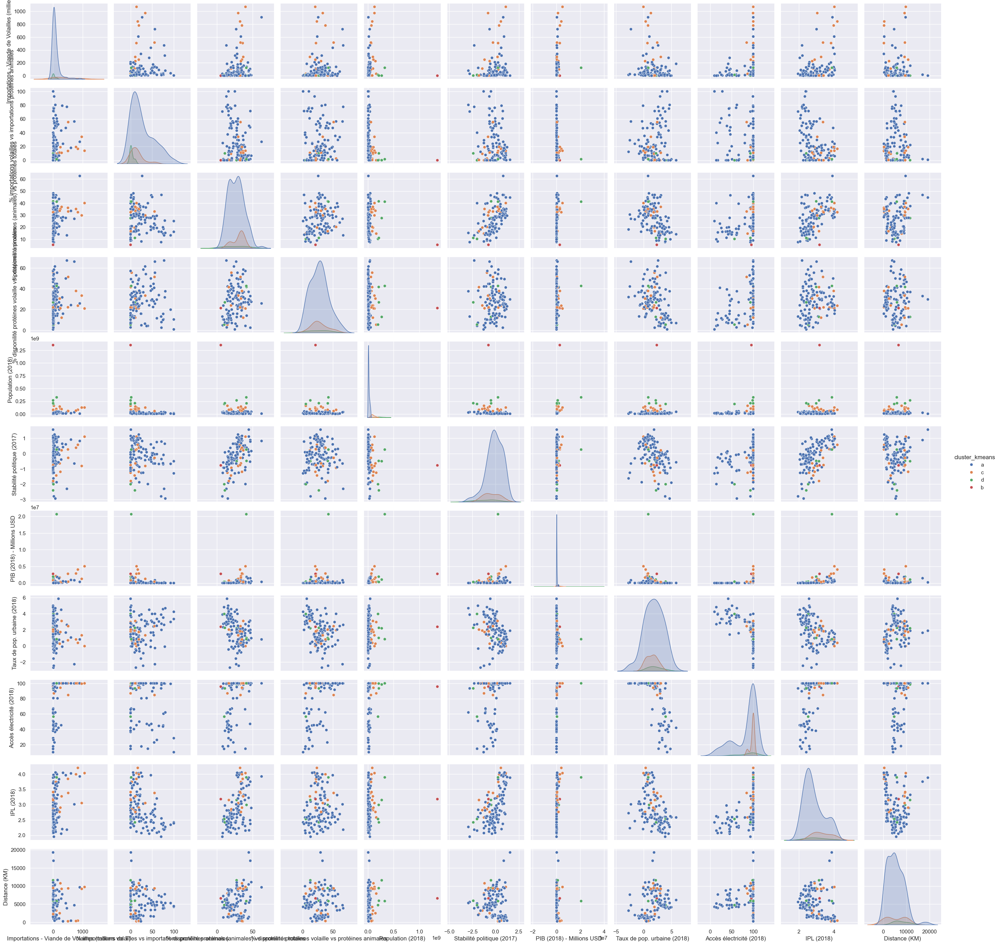

In [93]:
#Visualisation graphique des clusters
sns.pairplot(X, hue="cluster_kmeans")

Interprétation : La variable N°4 "Population (2018)" semble avoir une influence sur la séparation des 4 groupes. On distingue bien 4 clusters isolément dans l'espace. En revanche, les autres variables n'ont pas l'air d'influer sur la constitution des clusters car on ne distingue suffisamment pas les clusters les uns des autres.

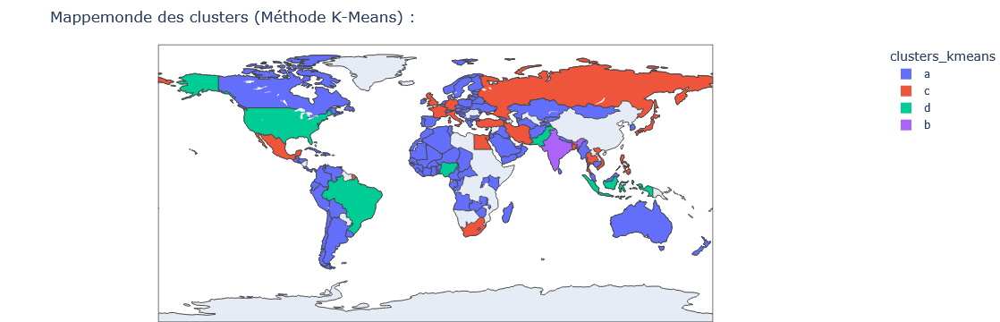

In [94]:
#Mappemonde colorimétrique représentant les pays par leur cluster associé (K-Means)

import plotly.express as px #import de la librairie

fig = px.choropleth(df_final_iso3, locations="Code Zone_ISO3",
                    color="clusters_kmeans",
                    hover_name="Zone", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma,
                   )
fig.update_layout(title_text='Mappemonde des clusters (Méthode K-Means) :', margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

## 4.3 - K-Means : Visualisation par les centroïdes

In [95]:
#On peut stocker nos centroides dans une variable
centroids = kmeans.cluster_centers_
centroids

array([[ 8.28841321e+01,  2.69316981e+01,  2.68838679e+01,
         2.75728302e+01,  1.53964122e+07, -1.17169811e-01,
         1.90937911e+05,  1.82450748e+00,  8.30028302e+01,
         2.84056604e+00,  5.24429515e+03],
       [ 1.80000000e-02,  0.00000000e+00,  5.36000000e+00,
         2.13100000e+01,  1.35264228e+09, -7.70000000e-01,
         2.76353498e+06,  2.36894121e+00,  9.57000000e+01,
         3.18000000e+00,  6.59423000e+03],
       [ 3.79651933e+02,  1.38860000e+01,  2.99693333e+01,
         2.81500000e+01,  9.52246554e+07, -4.16666667e-01,
         1.53351833e+06,  1.46226533e+00,  9.76733333e+01,
         3.33133333e+00,  5.33150003e+03],
       [ 2.83264000e+01,  2.40200000e+00,  2.63120000e+01,
         2.58460000e+01,  2.42467820e+08, -1.02400000e+00,
         4.87183014e+06,  2.03869849e+00,  8.96200000e+01,
         2.99600000e+00,  7.49710960e+03]])

In [96]:
import string

# Supposons que centroids.shape == (4, n_features)
n_clusters = centroids.shape[0]

# 1) Générer la liste ['a','b','c','d']
cluster_names = list(string.ascii_lowercase[:n_clusters])

# 2) Construire le DataFrame des centroïdes avec ces index
df_centroids_k = pd.DataFrame(
    centroids,
    columns=features,       # votre liste de noms de variables, length = n_features
    index=cluster_names     # ['a','b','c','d']
)

display(df_centroids_k.round(2))

,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),IPL (2018),Distance (KM)
a,82.88,26.93,26.88,27.57,1.539641e+07,-0.12,190937.91,1.82,83.00,2.84,5244.30
b,0.02,0.00,5.36,21.31,1.352642e+09,-0.77,2763534.98,2.37,95.70,3.18,6594.23
c,379.65,13.89,29.97,28.15,9.522466e+07,-0.42,1533518.33,1.46,97.67,3.33,5331.50
d,28.33,2.40,26.31,25.85,2.424678e+08,-1.02,4871830.14,2.04,89.62,3.00,7497.11


In [97]:
import pandas as pd

# Supposons que vos centroïdes sont dans la variable `centroids`
# et que features a déjà été ajusté à centroids.shape[1]

# 1) Définissez explicitement les noms de clusters
cluster_names = ['a', 'b', 'c', 'd']  
#    -> Assurez-vous que len(cluster_names) == centroids.shape[0]

# 2) Créez le DataFrame avec ces index
df_centroids_k = pd.DataFrame(
    centroids,
    columns=features,
    index=cluster_names
)

# 3) Affichez le résultat
print(df_centroids_k)

   Importations - Viande de Volailles (milliers de T)  \
a                                          82.884132    
b                                           0.018000    
c                                         379.651933    
d                                          28.326400    

   % importations volailles vs importations protéines animales  \
a                                          26.931698             
b                                           0.000000             
c                                          13.886000             
d                                           2.402000             

   % disponilité protéines (animales) vs protéines totales  \
a                                          26.883868         
b                                           5.360000         
c                                          29.969333         
d                                          26.312000         

   % disponilité protéines volaille vs protéines animales  Population (2

Interprétation : 

Le cluster a paraît le plus approprié pour notre développement de vente de poulets à l'international :
- Valeur absolue de 476.8 milliers de T (même si le % d'importations est < au cluster c)
- Accès à l'électricité et indice IPL les plus élevés parmis tous les clusters
- Indice de stabilité politique raisonnable

In [98]:
#Calcul des coordonnées de nos individus dans le nouvel espace
X_proj = pca.transform(X_scaled)
X_proj[:5]

#Dataframe représentant les projections dans le nouvel espace d'axes d'inertie
df_X_proj = pd.DataFrame(X_proj, columns=["F1", "F2", "F3", "F4", "F5", "F6", "F7"])

Centroïdes => projection dans le "nouvel espace" des cercles de corrélation :

In [99]:
# Scalons les centroïdes avant de les calculer (pour le scaling, il faut prendre le scaler qui a été fit sur les données d'origines) :
centroids_scaled = scaler.fit_transform(centroids)
centroids_scaled

# et on utilise l'ACP déjà entrainée : 
centroids_proj = pca.transform(centroids_scaled)

# Création d'un dataframe pour plus de clarté:
df_centroids_proj = pd.DataFrame(centroids_proj, columns = ["F1", "F2", "F3", "F4", "F5", "F6", "F7"] , index=["cluster_a", "cluster_b", "cluster_c", "cluster_d"])
print('Projection des centroïdes : Méthode du K-means')
df_centroids_proj

Projection des centroïdes : Méthode du K-means


,F1,F2,F3,F4,F5,F6,F7
cluster_a,-0.839473,-2.410586,-0.278872,0.228499,0.590620,0.797965,0.685275
cluster_b,-1.162970,2.646693,-0.446837,-1.102353,-0.290495,-0.820898,0.628404
cluster_c,2.556073,-1.389004,0.691842,0.054193,0.932088,-0.975884,-0.178754
cluster_d,-0.553629,1.152897,0.033867,0.819660,-1.232213,0.998817,-1.134925


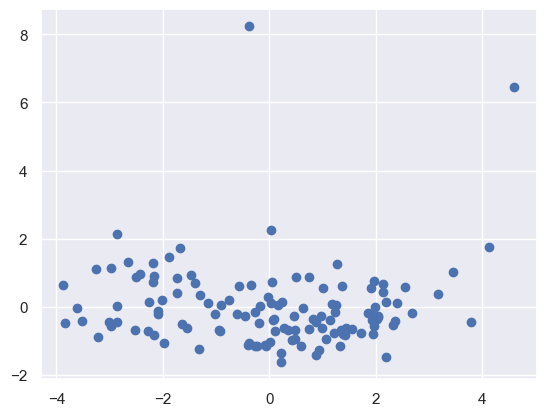

In [100]:
#Affichage du nuage de points
plt.scatter(df_X_proj.iloc[:, 0], df_X_proj.iloc[:, 1])

Projection des clusters sur 2 dimensions (F1, F2) :

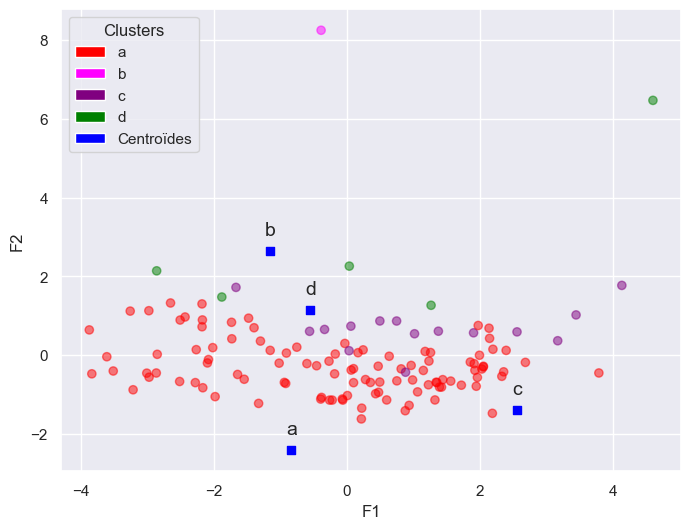

In [101]:
#Projection des clusters sur 2 dimensions (F1, F2) :

#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_str = label_encoder.inverse_transform(labels_encoded)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_str]

# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,6))

# Affichage des pays, avec une transparence (alpha) et on colorie les points en fonction de leurs labels : 
ax.scatter(df_X_proj.iloc[:, 0], df_X_proj.iloc[:, 1], c= point_colors, alpha =0.5)

# Affichage des centroides, avec une couleur et une forme de carré (marker="s") : 
ax.scatter(df_centroids_proj.iloc[:, 0], df_centroids_proj.iloc[:, 1], marker="s", c="blue", label="Centroïdes")

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_k.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_proj.iloc[i, 0]
    y = df_centroids_proj.iloc[i, 1]
    ax.text(x, y + 0.3, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable


# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# On spécifie les axes x et y :
ax.set_xlabel("F1")
ax.set_ylabel("F2")
plt.show()

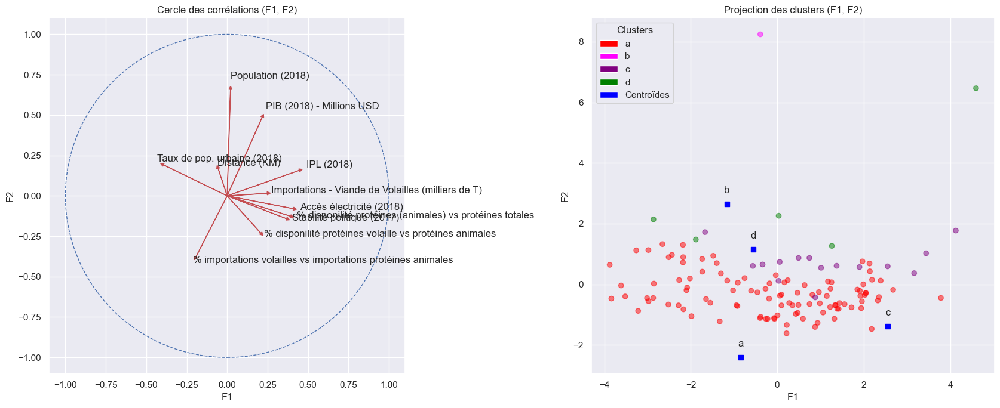

In [102]:
#Affichage simultané => Cercle de corrélations F1/F2 et Projection des clusters sur dimensions (F1, F2) :


# 1/ Fonction modifiée pour tracer dans un axe donné
def correlation_graph(pca, x_y, features, ax):
    pcs = pca.components_
    for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
        ax.arrow(0, 0, x, y, head_width=0.02, head_length=0.02, fc='r', ec='r')
        ax.text(x * 1.1, y * 1.1, features[i], fontsize=12)

    # Cercle unité
    circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b', linestyle='--')
    ax.add_patch(circle)

    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel("F1")
    ax.set_ylabel("F2")
    ax.set_aspect('equal')
    ax.grid(True) #Afficher le quadrillage sinon le retire par défaut
    ax.set_title("Cercle des corrélations (F1, F2)")


# 2/ Création de la figure avec 2 sous-graphiques

fig, axs = plt.subplots(1, 2, figsize=(17, 7))  # 1 ligne, 2 colonnes

# Graphique 1 : Cercle des corrélations
correlation_graph(pca, x_y, features, ax=axs[0])

# Graphique 2 : Projection des clusters
# Encodage des labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)
labels_encoded_str = label_encoder.inverse_transform(labels_encoded)

# Couleurs des points selon les clusters
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}
point_colors = [custom_colors[label] for label in labels_encoded_str]

# Affichage des points et centroïdes
axs[1].scatter(df_X_proj.iloc[:, 0], df_X_proj.iloc[:, 1], c=point_colors, alpha=0.5)
axs[1].scatter(df_centroids_proj.iloc[:, 0], df_centroids_proj.iloc[:, 1], marker="s", c="blue", label="Centroïdes")

# Noms des centroïdes
for i, cluster_name in enumerate(df_centroids_k.index):
    x = df_centroids_proj.iloc[i, 0]
    y = df_centroids_proj.iloc[i, 1]
    axs[1].text(x, y + 0.3, cluster_name, fontsize=12, ha='center', va='bottom')

# Légende
legend_elements = [Patch(facecolor=custom_colors[label], label=label) for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))
axs[1].legend(handles=legend_elements, title="Clusters")

# Titres et axes
axs[1].set_title("Projection des clusters (F1, F2)")
axs[1].set_xlabel("F1")
axs[1].set_ylabel("F2")

plt.tight_layout()
plt.show()

Interprétation du plan F1/F2 : 
- Les clusters sont difficilement identifiables à l'oeil nu, ils se superposent les uns aux autres
- Sans l'affichage des centroïdes, il est compliqué de les identifier sur le plan : l'algorithme K-Means n'est pas parvenu à minimiser efficacement l'inertie intra-classe
- Pour notre développement à l'international, on devrait se concentrer sur les pays situés dans la zone avec une composante F1 max (IPL, accès éléctricité, stabilité politique) et une composante F2 autour de 0 (population, PIB et % importations volailles influençant F2 dans le sens inverse) : cela correspond au cluster a.

Projection des clusters sur 2 dimensions (F3, F4) :

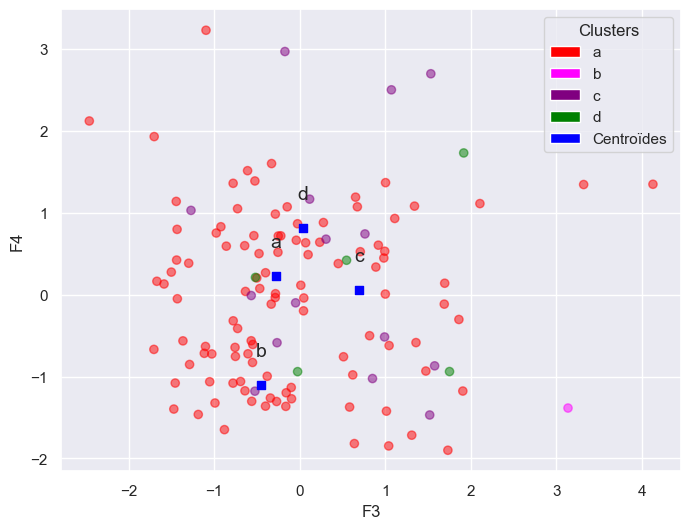

In [103]:
#Projection des clusters sur 2 dimensions (F3, F4) :

#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_str = label_encoder.inverse_transform(labels_encoded)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_str]

# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,6))

# Affichage des pays, avec une transparence (alpha et on colorie les points en fonction de leurs labels : 
ax.scatter(df_X_proj.iloc[:, 2], df_X_proj.iloc[:, 3], c= point_colors, alpha =0.5)

# Affichage des centroides, avec une couleur et une forme de carré (marker="s") : 
ax.scatter(df_centroids_proj.iloc[:, 2], df_centroids_proj.iloc[:, 3], marker="s", c="blue", label="Centroïdes")

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_k.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_proj.iloc[i, 2]
    y = df_centroids_proj.iloc[i, 3]
    ax.text(x, y + 0.3, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# On spécifie les axes x et y :
ax.set_xlabel("F3")
ax.set_ylabel("F4")
plt.show()

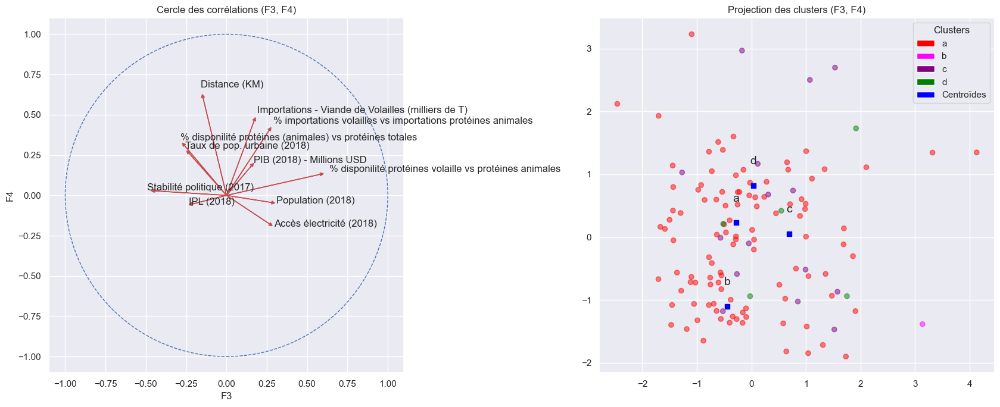

In [104]:
#Affichage simultané => Cercle de corrélations F3/F4 et Projection des clusters sur dimensions (F3, F4) :


# 1/ Fonction modifiée pour tracer dans un axe donné
def correlation_graph(pca, x_y, features, ax):
    pcs = pca.components_
    for i, (x, y) in enumerate(zip(pcs[2, :], pcs[3, :])):
        ax.arrow(0, 0, x, y, head_width=0.02, head_length=0.02, fc='r', ec='r')
        ax.text(x * 1.1, y * 1.1, features[i], fontsize=12)

    # Cercle unité
    circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b', linestyle='--')
    ax.add_patch(circle)

    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel("F3")
    ax.set_ylabel("F4")
    ax.set_aspect('equal')
    ax.grid(True) #Afficher le quadrillage sinon le retire par défaut
    ax.set_title("Cercle des corrélations (F3, F4)")


# 2/ Création de la figure avec 2 sous-graphiques

fig, axs = plt.subplots(1, 2, figsize=(17, 7))  # 1 ligne, 2 colonnes

# Graphique 1 : Cercle des corrélations
correlation_graph(pca, (2,3), features, ax=axs[0])


# Graphique 2 : Projection des clusters
#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)  # '0' → a, '1' → b, '2' → c, etc

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_str = label_encoder.inverse_transform(labels_encoded)

# Couleurs des points selon les clusters
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}
point_colors = [custom_colors[label] for label in labels_encoded_str]


# Affichage des pays et centroïdes
axs[1].scatter(df_X_proj.iloc[:, 2], df_X_proj.iloc[:, 3], c= point_colors, alpha =0.5)
axs[1].scatter(df_centroids_proj.iloc[:, 2], df_centroids_proj.iloc[:, 3], marker="s", c="blue", label="Centroïdes")

# Nom des centroïdes
for i, cluster_name in enumerate(df_centroids_k.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_proj.iloc[i, 2]
    y = df_centroids_proj.iloc[i, 3]
    axs[1].text(x, y + 0.3, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Légende
legend_elements = [Patch(facecolor=custom_colors[label], label=label) for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))
axs[1].legend(handles=legend_elements, title="Clusters")

# Titres et axes
axs[1].set_title("Projection des clusters (F3, F4)")
ax.set_xlabel("F3")
ax.set_ylabel("F4")

plt.tight_layout()
plt.show()

Interprétation du plan F3/F4 : 
- Cette fois-ci encore, les clusters se superposent les uns aux autres ce qui rend l'identification des clusters ardue.
- Sans l'affichage des centroïdes, il est compliqué de les identifier sur le plan : l'algorithme K-Means n'est pas parvenu à minimiser efficacement l'inertie intra-classe
- Pour notre développement à l'international, on devrait se concentrer sur les pays situés dans la zone avec une composante F3 négative (IPL, stabilité politique) et une composante F4 probalement positive (importations, distance) : ce sont les clusters b et d qui correspondent le plus à ce que l'on recherche.

Projection des clusters sur 2 dimensions (F4, F5) :

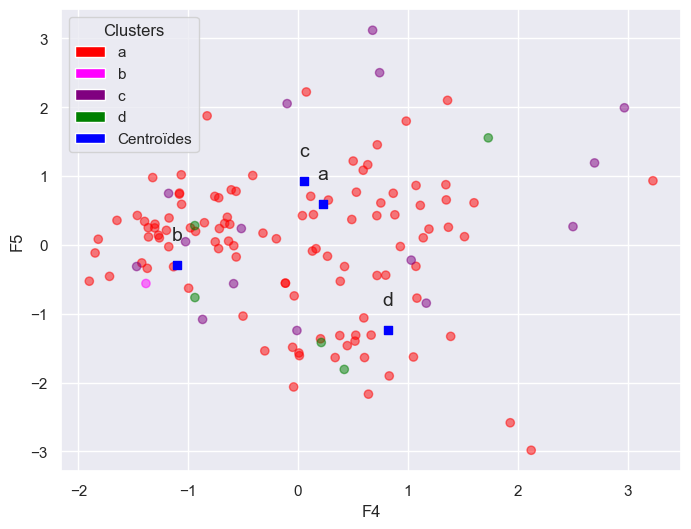

In [105]:
#Projection des clusters sur 2 dimensions (F4, F5) :

#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_str = label_encoder.inverse_transform(labels_encoded)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_str]

# On définit notre figure et son axe : 
fig, ax = plt.subplots(1,1, figsize=(8,6))

# Affichage des pays, avec une transparence (alpha) et on colorie les points en fonction de leurs labels : 
ax.scatter(df_X_proj.iloc[:, 3], df_X_proj.iloc[:, 4], c= point_colors, alpha =0.5)

# Affichage des centroides, avec une couleur et une forme de carré (marker="s") : 
ax.scatter(df_centroids_proj.iloc[:, 3], df_centroids_proj.iloc[:, 4], marker="s", c="blue", label="Centroïdes")

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_k.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_proj.iloc[i, 3]
    y = df_centroids_proj.iloc[i, 4]
    ax.text(x, y + 0.3, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# On spécifie les axes x et y :
ax.set_xlabel("F4")
ax.set_ylabel("F5")
plt.show()

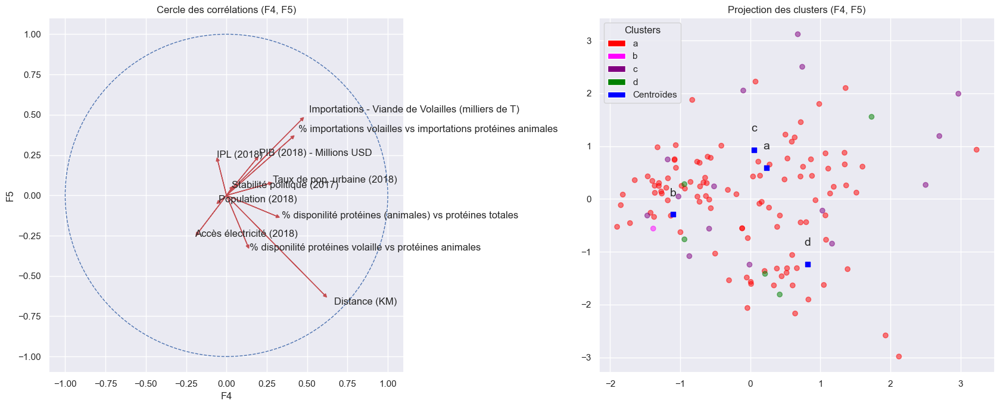

In [106]:
#Affichage simultané => Cercle de corrélations F4/F5 et Projection des clusters sur dimensions (F4, F5) :


# 1/ Fonction modifiée pour tracer dans un axe donné
def correlation_graph(pca, x_y, features, ax):
    pcs = pca.components_
    for i, (x, y) in enumerate(zip(pcs[3, :], pcs[4, :])):
        ax.arrow(0, 0, x, y, head_width=0.02, head_length=0.02, fc='r', ec='r')
        ax.text(x * 1.1, y * 1.1, features[i], fontsize=12)

    # Cercle unité
    circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b', linestyle='--')
    ax.add_patch(circle)

    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel("F4")
    ax.set_ylabel("F5")
    ax.set_aspect('equal')
    ax.grid(True) #Afficher le quadrillage sinon le retire par défaut
    ax.set_title("Cercle des corrélations (F4, F5)")


# 2/ Création de la figure avec 2 sous-graphiques

fig, axs = plt.subplots(1, 2, figsize=(17, 7))  # 1 ligne, 2 colonnes

# Graphique 1 : Cercle des corrélations
correlation_graph(pca, (3,4), features, ax=axs[0])


# Graphique 2 : Projection des clusters
#Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)  # '0' → a, '1' → b, '2' → c, etc

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_str = label_encoder.inverse_transform(labels_encoded)

# Couleurs des points selon les clusters
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}
point_colors = [custom_colors[label] for label in labels_encoded_str]


# Affichage des pays et centroïdes
axs[1].scatter(df_X_proj.iloc[:, 3], df_X_proj.iloc[:, 4], c= point_colors, alpha =0.5)
axs[1].scatter(df_centroids_proj.iloc[:, 3], df_centroids_proj.iloc[:, 4], marker="s", c="blue", label="Centroïdes")

# Nom des centroïdes
for i, cluster_name in enumerate(df_centroids_k.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_proj.iloc[i, 3]
    y = df_centroids_proj.iloc[i, 4]
    axs[1].text(x, y + 0.3, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Légende
legend_elements = [Patch(facecolor=custom_colors[label], label=label) for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))
axs[1].legend(handles=legend_elements, title="Clusters")

# Titres et axes
axs[1].set_title("Projection des clusters (F4, F5)")
ax.set_xlabel("F4")
ax.set_ylabel("F5")

plt.tight_layout()
plt.show()

Interprétation du plan F4/F5 : 
- Idem, les clusters superposés et très étalés ne nous permettent pas de les identifier rapidement à l'oeil nu
- Sans l'affichage des centroïdes, il est compliqué de les identifier sur le plan : l'algorithme K-Means n'est pas parvenu à minimiser efficacement l'inertie intra-classe
- Pour notre développement à l'international, on devrait se concentrer sur les pays situés dans la zone avec une composante F4 probalement positive (importations, distance) et une composante F5 positive (importations et distance inluençant F5 négativement) : ce sont les clusters a et c qui correspondent le plus à ce que l'on recherche.

Projection des clusters sur 3 dimensions (F3, F4, F5) : 

Text(0.5, 0, 'F5')

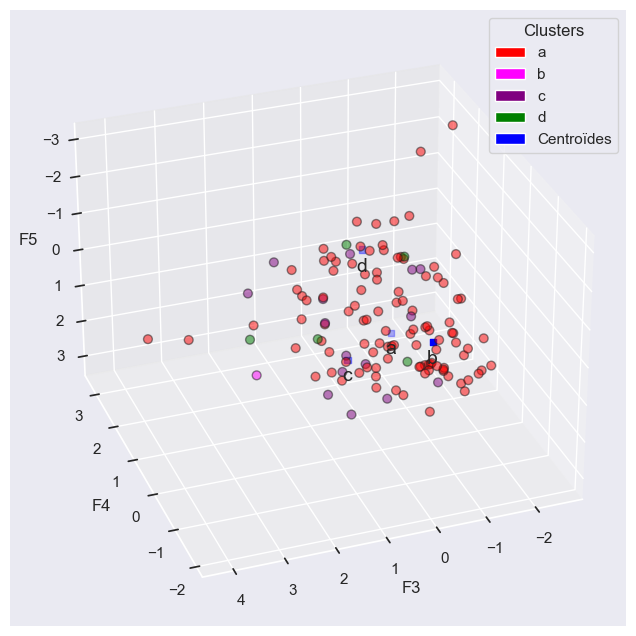

In [107]:
# Projection des clusters sur 3 dimensions (F3, F4, F5) :

# Conversion labels ('a', 'b', 'c', 'd') en valeurs numériques pour application de palette colorimétrique dans le nuage de points 
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)  # '0' → a, '1' → b, '2' → c, etc.

# Définition des couleurs personnalisées pour chaque label
custom_colors = {'a': 'red', 'b': 'magenta',  'c': 'purple', 'd': 'green'}

# Conversion des entiers en labels string pour accéder au dictionnaire
labels_encoded_str = label_encoder.inverse_transform(labels_encoded)

# Association de couleurs à chaque point : création liste de couleurs selon les labels originaux
point_colors = [custom_colors[label] for label in labels_encoded_str]

# On définit notre figure et notre axe différemment : 
fig= plt.figure(1, figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

# Affichage des pays
ax.scatter(df_X_proj.iloc[:, 2], df_X_proj.iloc[:, 3], df_X_proj.iloc[:, 4], c= point_colors, edgecolor="k", s=40, alpha =0.5)

# Affichage des centroides, avec une couleur et une forme de carré (marker="s") : 
ax.scatter(df_centroids_proj.iloc[:, 2], df_centroids_proj.iloc[:, 3], df_centroids_proj.iloc[:, 4], marker="s", c="blue" )

# Ajout du cluster sur les centroïdes :
for i, cluster_name in enumerate(df_centroids_k.index):   # Le nom des clusters est en index (et pas dans une colonne du dataframe)
    x = df_centroids_proj.iloc[i, 2]
    y = df_centroids_proj.iloc[i, 3]
    z = df_centroids_proj.iloc[i, 4]
    ax.text(x, y, z + 0.7, cluster_name, fontsize=14, ha='center', va='bottom')  # Position ajustable

# Création de la légende personnalisée
legend_elements = [Patch(facecolor=custom_colors[label], label=label)
    for label in label_encoder.classes_]
legend_elements.append(Patch(facecolor="blue", label="Centroïdes"))

# Ajout de la légende
ax.legend(handles=legend_elements, title="Clusters")

# Nom des axes
ax.set_xlabel("F3")
ax.set_ylabel("F4")
ax.set_zlabel("F5")

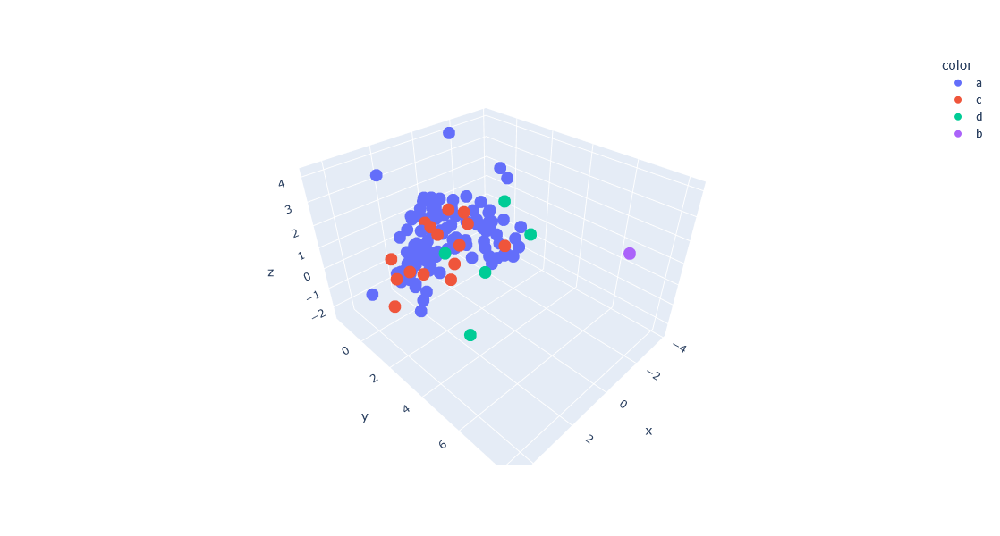

In [108]:
#Projection des clusters sur 3 dimensions (F3, F4, F5)

#Affichage via plotly
fig = px.scatter_3d(x=df_X_proj.iloc[:,0], y=df_X_proj.iloc[:,1], z=df_X_proj.iloc[:, 2], color=labels)
fig.update_layout(width=800, height=600)
fig.show()

# Etape 5 - Analyses et recommandations post-clustering

Si on compare les 2 méthodes (K-Means et CAH) : 

- Visuellement, on remarque une différence flagrante quant à la projection des clusters sur les 5 composantes.

- Les clusters sont bien plus éloignés les uns des autres avec la méthode de la CAH : on arrive beaucoup plus facilement à repérer les clusters sur les différentes projections 2D avec la classification hiérarchique, alors qu'avec l'algorithme du K-Means aucun cluster n'est identifiable visuellement sur aucune des projections.

- Chacun des clusters parait plus resséré avec la méthode de la CAH qu'avec le K-Means. Avec le K-Means, il est difficile de détecter à l'oeil nu sur les plans les différents clusters car ils se superposent. Avec la CAH, on arrive facilement à distinguer les différents clusters sur les plans.

- A nombre de clusters égaux (=4), nous retiendrons que le clustering est plus efficace par le biais de la classification hiérarchique que par le K-Means.

- Conclusion : On retiendra uniquement la méthode de la classification hiérarchique pour la suite des analyses et les recommandations ci-après (partie 5 du Notebook).

## 5.1 - Visualisation des clusters : Heatmap

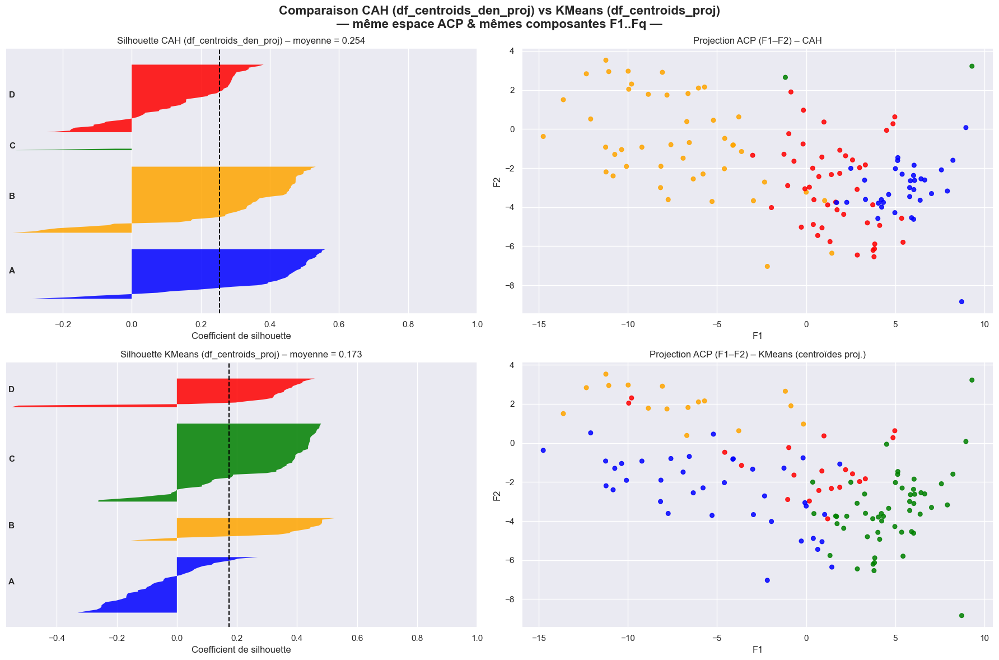

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.spatial.distance import cdist

# ─────────────────────────────────────────────────────────────────────────────
# PRÉREQUIS attendus dans l'environnement :
# - df_final_iso3_quanti : DataFrame individus avec 'clusters_den' (a/b/c/d)
# - scaler, pca : objets DÉJÀ FIT sur les variables d'origine
# - df_centroids_den_proj : centroïdes CAH projetés en ACP (index a/b/c/d ou cluster_*)
# - df_centroids_proj     : centroïdes KMeans projetés en ACP (index a/b/c/d ou cluster_*)
# ─────────────────────────────────────────────────────────────────────────────

# 1) Nettoyage des index (cluster_a -> a) et mise dans le même ordre a,b,c,d
def _clean_index(df):
    idx = (df.index.astype(str)
                 .str.lower()
                 .str.replace(r"^cluster_", "", regex=True))
    out = df.copy()
    out.index = idx
    order = [c for c in ["a","b","c","d"] if c in out.index]
    return out.loc[order]

cent_den = _clean_index(df_centroids_den_proj)   # CAH : centroïdes projetés
cent_km  = _clean_index(df_centroids_proj)       # KMeans : centroïdes projetés

# 2) Colonnes communes F1..Fq (on garde le même sous-espace pour CAH & KMeans)
def _common_F_cols(df1, df2):
    f1 = [c for c in df1.columns if c.startswith("F")]
    f2 = [c for c in df2.columns if c.startswith("F")]
    q  = min(len(f1), len(f2))
    return [f"F{i}" for i in range(1, q+1)]

comp_cols = _common_F_cols(cent_den, cent_km)
assert len(comp_cols) > 0, "Aucune composante commune F1..Fq entre df_centroids_den_proj et df_centroids_proj."

# 3) Projection de TOUS les individus dans l'ACP et restriction au même sous-espace
X_std = scaler.transform(df_final_iso3_quanti.select_dtypes(include=[np.number]).values)
X_acp = pca.transform(X_std)
X_use = X_acp[:, :len(comp_cols)]  # même dimension que comp_cols

# 4) Labels CAH (clusters_den) -> entiers dans l'ordre des centroïdes CAH
labels_cah_str = df_final_iso3_quanti["clusters_den"].astype(str).str.lower().values
letters_cah = list(cent_den.index)  # ordre imposé par df_centroids_den_proj
letter2num_cah = {l:i for i,l in enumerate(letters_cah)}
# S'il y a des lettres absentes dans labels_cah_str, on les ignore naturellement
labels_cah_num = np.array([letter2num_cah[l] for l in labels_cah_str if l in letter2num_cah])

# ⚠️ Assurer l'alignement de X_use et labels_cah_num
# (si des pays ont un label hors de letters_cah, on doit filtrer X_use de la même façon)
mask_keep = np.array([l in letter2num_cah for l in labels_cah_str])
X_use_cah = X_use[mask_keep]

# 5) Labels KMeans par assignation au centroïde KMeans le plus proche (dans le même espace)
D_km = cdist(X_use, cent_km[comp_cols].values, metric="euclidean")  # (n x k)
labels_km_num = D_km.argmin(axis=1)  # 0..k-1
num2letter_km = {i:l for i,l in enumerate(cent_km.index)}
labels_km_str = np.vectorize(num2letter_km.get)(labels_km_num)

# 6) Silhouettes (sur le même X_use)
# CAH
sil_vals_cah = silhouette_samples(X_use_cah, labels_cah_num)
sil_cah      = sil_vals_cah.mean()
# KMeans
sil_vals_km = silhouette_samples(X_use, labels_km_num)
sil_km      = sil_vals_km.mean()

# 7) Tracé comparatif
colors = {"a":"blue","b":"orange","c":"green","d":"red"}

def plot_sil(ax, X, sil_vals, labels_num, mapper_num2letter, letters_order, title):
    x_min = float(min(-0.1, sil_vals.min() - 0.02))
    ax.set_xlim([x_min, 1])
    ax.set_ylim([0, len(X) + (len(letters_order)+1)*10])

    y_lower = 10
    for letter in letters_order:
        # trouver l'ID numérique associé à cette lettre
        ks = [k for k,v in mapper_num2letter.items() if v == letter]
        if not ks:
            continue
        k = ks[0]
        ith = sil_vals[labels_num == k]
        ith.sort()
        size_k = ith.shape[0]
        y_upper = y_lower + size_k
        ax.fill_betweenx(np.arange(y_lower, y_upper), 0, ith,
                         facecolor=colors.get(letter, "gray"),
                         edgecolor="none", alpha=0.85)
        ax.text(x_min + 0.01, y_lower + 0.5*size_k, letter.upper(),
                fontsize=11, weight="bold")
        y_lower = y_upper + 10

    ax.axvline(x=np.mean(sil_vals), color="black", linestyle="--")
    ax.set_xlabel("Coefficient de silhouette")
    ax.set_yticks([])
    ax.set_title(f"{title} – moyenne = {np.mean(sil_vals):.3f}")

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# (Haut) CAH via df_centroids_den_proj
plot_sil(
    axes[0,0],
    X_use_cah,
    sil_vals_cah,
    labels_cah_num,
    {v:k for k,v in letter2num_cah.items()},  # num->letter inverse
    letters_cah,
    "Silhouette CAH (df_centroids_den_proj)"
)
axes[0,1].scatter(
    X_use[:,0], X_use[:,1],
    c=[colors.get(l, "gray") for l in labels_cah_str],
    s=30, alpha=0.85
)
axes[0,1].set_title("Projection ACP (F1–F2) – CAH")
axes[0,1].set_xlabel("F1"); axes[0,1].set_ylabel("F2")

# (Bas) KMeans via df_centroids_proj
plot_sil(
    axes[1,0],
    X_use,
    sil_vals_km,
    labels_km_num,
    {k:v for k,v in num2letter_km.items()},   # num->letter
    list(cent_km.index),
    "Silhouette KMeans (df_centroids_proj)"
)
axes[1,1].scatter(
    X_use[:,0], X_use[:,1],
    c=[colors.get(l, "gray") for l in labels_km_str],
    s=30, alpha=0.85
)
axes[1,1].set_title("Projection ACP (F1–F2) – KMeans (centroïdes proj.)")
axes[1,1].set_xlabel("F1"); axes[1,1].set_ylabel("F2")

plt.suptitle("Comparaison CAH (df_centroids_den_proj) vs KMeans (df_centroids_proj)\n— même espace ACP & mêmes composantes F1..Fq —",
             fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()


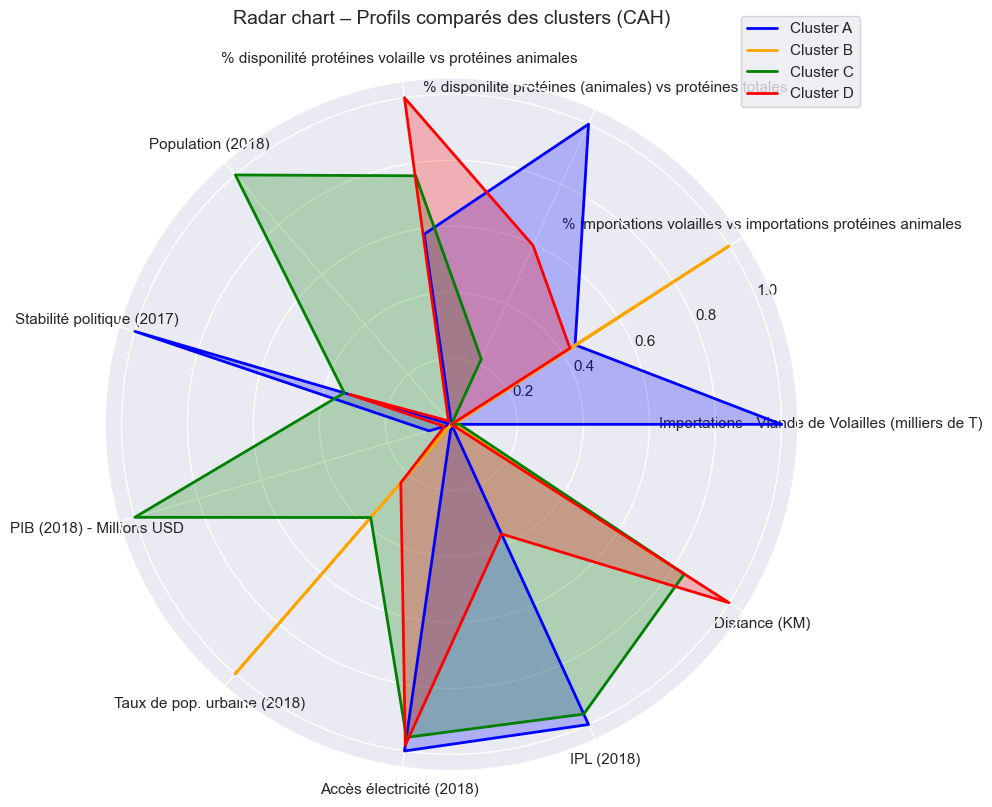

In [110]:
import matplotlib.pyplot as plt
import numpy as np

# --- Variables métier (colonnes de df_centroids_den)
categories = list(df_centroids_den.columns)
N = len(categories)

# --- Préparation des angles pour fermer la boucle
angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
angles += angles[:1]

# --- Normalisation min-max pour rendre toutes les variables comparables
means_norm = (df_centroids_den - df_centroids_den.min()) / (df_centroids_den.max() - df_centroids_den.min())

plt.figure(figsize=(9,9))

# Couleurs fixes (CAH : a=bleu, b=orange, c=vert, d=rouge)
colors = {"a":"blue","b":"orange","c":"green","d":"red"}

# --- Tracé de chaque cluster
for cluster in means_norm.index:
    values = means_norm.loc[cluster].tolist()
    values += values[:1]
    plt.polar(angles, values,
              label=f"Cluster {cluster.upper()}",
              linewidth=2,
              color=colors.get(cluster,"gray"))
    plt.fill(angles, values, alpha=0.25, color=colors.get(cluster,"gray"))

# --- Mise en forme
plt.xticks(angles[:-1], categories, rotation=45, ha="center")
plt.title("Radar chart – Profils comparés des clusters (CAH)", fontsize=14, pad=20)
plt.legend(loc="upper right", bbox_to_anchor=(1.1, 1.1))
plt.show()


In [111]:
#Liste des clusters - Classification hiérarchique

print('Cluster a :',df_final_iso3.loc[df_final_iso3['clusters_den']=='a'].shape[0],'pays')
print('Cluster b :',df_final_iso3.loc[df_final_iso3['clusters_den']=='b'].shape[0],'pays')
print('Cluster c :',df_final_iso3.loc[df_final_iso3['clusters_den']=='c'].shape[0],'pays')
print('Cluster d :',df_final_iso3.loc[df_final_iso3['clusters_den']=='d'].shape[0],'pays')

Cluster a : 34 pays
Cluster b : 45 pays
Cluster c : 2 pays
Cluster d : 46 pays


<Axes: xlabel='clusters_den'>

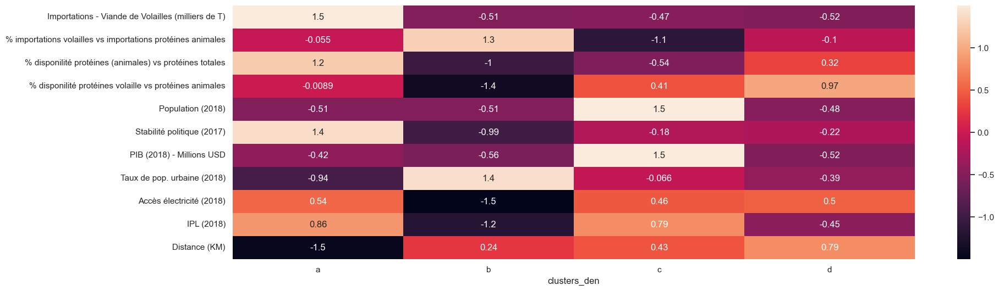

In [112]:
#Heatmap
fig, ax = plt.subplots(figsize=(20, 6))

#Normalisation des valeurs (centrées-réduites)
df_centroids_den_normalisation = (df_centroids_den-df_centroids_den.mean())/df_centroids_den.std()

sns.heatmap(df_centroids_den_normalisation.T, annot=True)

On cherche le cluster avec le plus de variables de couleurs claires : c'est le cluster a qui se démarque des autres avec 3 variables.

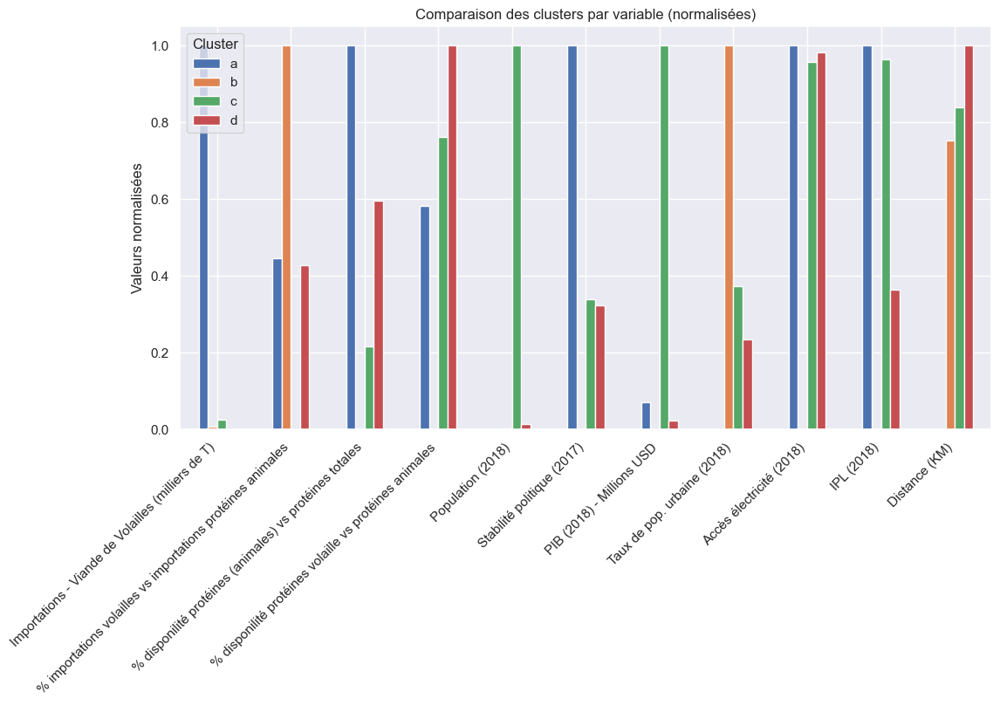

In [113]:
means_norm.T.plot(kind="bar", figsize=(12,6))
plt.title("Comparaison des clusters par variable (normalisées)")
plt.ylabel("Valeurs normalisées")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Cluster")
plt.show()

## 5.2 - Visualisation des clusters : Boxplots des variables par cluster

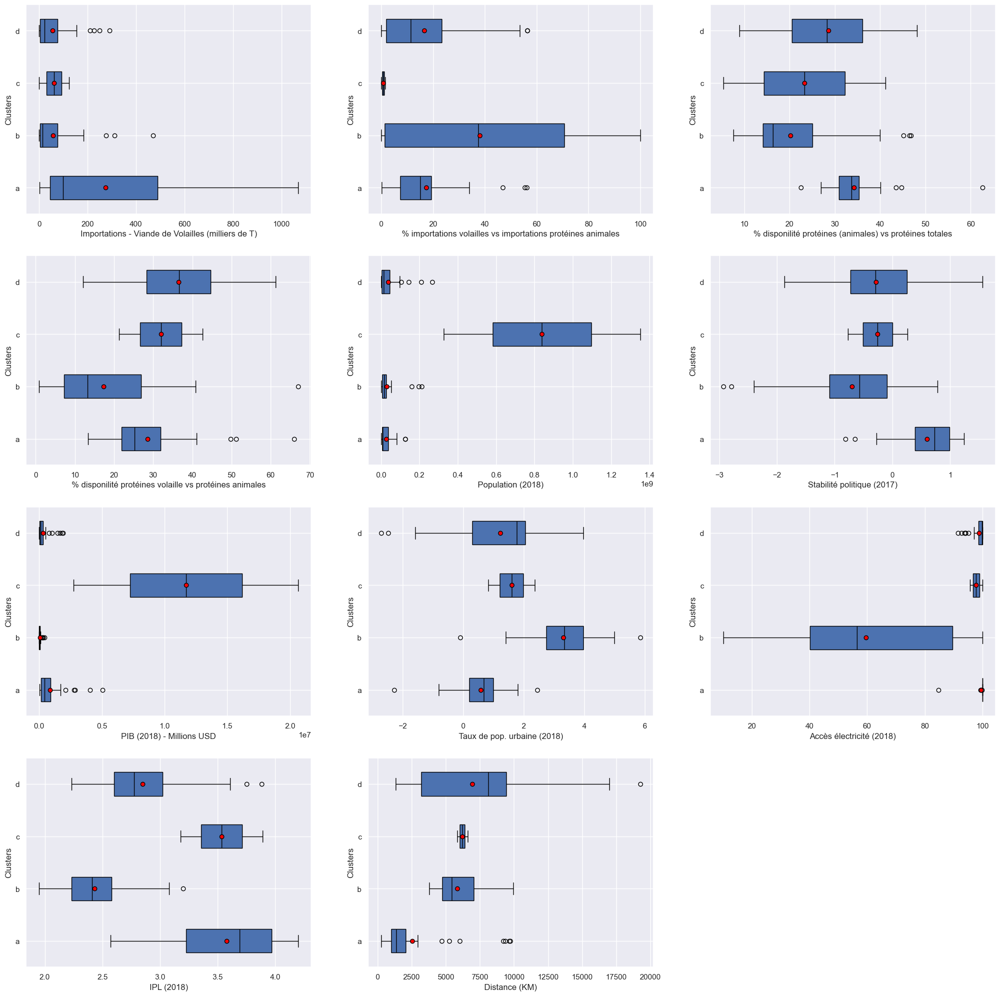

In [114]:
#Visualisation via boxplots des variables - Pour chaque cluster

df_final_boxplots = df_final_iso3_quanti.copy()
valeurs = sorted(df_final_boxplots['clusters_den'].unique())    #Liste valeurs uniques
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black', 'markerfacecolor':'red'}
plt.figure(1,figsize=(25,25))


#Boxplot 1
plt.subplot(4,3,1)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 1
groupe1 = []
for m in valeurs:
    groupe1.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['Importations - Viande de Volailles (milliers de T)'])   #Propriétés graphiques   
plt.boxplot(groupe1, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('Importations - Viande de Volailles (milliers de T)')


#Boxplot 2
plt.subplot(4,3,2)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 2
groupe2 = []
for m in valeurs:
    groupe2.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['% importations volailles vs importations protéines animales'])   #Propriétés graphiques  
plt.boxplot(groupe2, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('% importations volailles vs importations protéines animales')


#Boxplot 3
plt.subplot(4,3,3)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 3
groupe3 = []
for m in valeurs:
    groupe3.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['% disponilité protéines (animales) vs protéines totales'])   #Propriétés graphiques  
plt.boxplot(groupe3, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('% disponilité protéines (animales) vs protéines totales')


#Boxplot 4
plt.subplot(4,3,4)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 4
groupe4 = []
for m in valeurs:
    groupe4.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['% disponilité protéines volaille vs protéines animales'])   #Propriétés graphiques  
plt.boxplot(groupe4, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('% disponilité protéines volaille vs protéines animales')


#Boxplot 5
plt.subplot(4,3,5)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 5
groupe5 = []
for m in valeurs:
    groupe5.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['Population (2018)'])   #Propriétés graphiques  
plt.boxplot(groupe5, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('Population (2018)')


#Boxplot 6
plt.subplot(4,3,6)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 6
groupe6 = []
for m in valeurs:
    groupe6.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['Stabilité politique (2017)'])   #Propriétés graphiques  
plt.boxplot(groupe6, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('Stabilité politique (2017)')


#Boxplot 7
plt.subplot(4,3,7)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 7
groupe7 = []
for m in valeurs:
    groupe7.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['PIB (2018) - Millions USD'])   #Propriétés graphiques  
plt.boxplot(groupe7, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('PIB (2018) - Millions USD')


#Boxplot 8
plt.subplot(4,3,8)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 8
groupe8 = []
for m in valeurs:
    groupe8.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['Taux de pop. urbaine (2018)'])   #Propriétés graphiques  
plt.boxplot(groupe8, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('Taux de pop. urbaine (2018)')


#Boxplot 9
plt.subplot(4,3,9)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 9
groupe9 = []
for m in valeurs:
    groupe9.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['Accès électricité (2018)'])   #Propriétés graphiques  
plt.boxplot(groupe9, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('Accès électricité (2018)')


#Boxplot 10
plt.subplot(4,3,10)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 10
groupe10 = []
for m in valeurs:
    groupe10.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['IPL (2018)'])   #Propriétés graphiques  
plt.boxplot(groupe10, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('IPL (2018)')


#Boxplot 11
plt.subplot(4,3,11)    #Visualisation : nombre de lignes, nombre de colonnes, index
#Affichage boxplot 11
groupe11 = []
for m in valeurs:
    groupe11.append(df_final_boxplots[df_final_boxplots['clusters_den']==m]['Distance (KM)'])   #Propriétés graphiques  
plt.boxplot(groupe11, labels = valeurs, showfliers=True, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.ylabel('Clusters')
plt.xlabel('Distance (KM)')


plt.show()

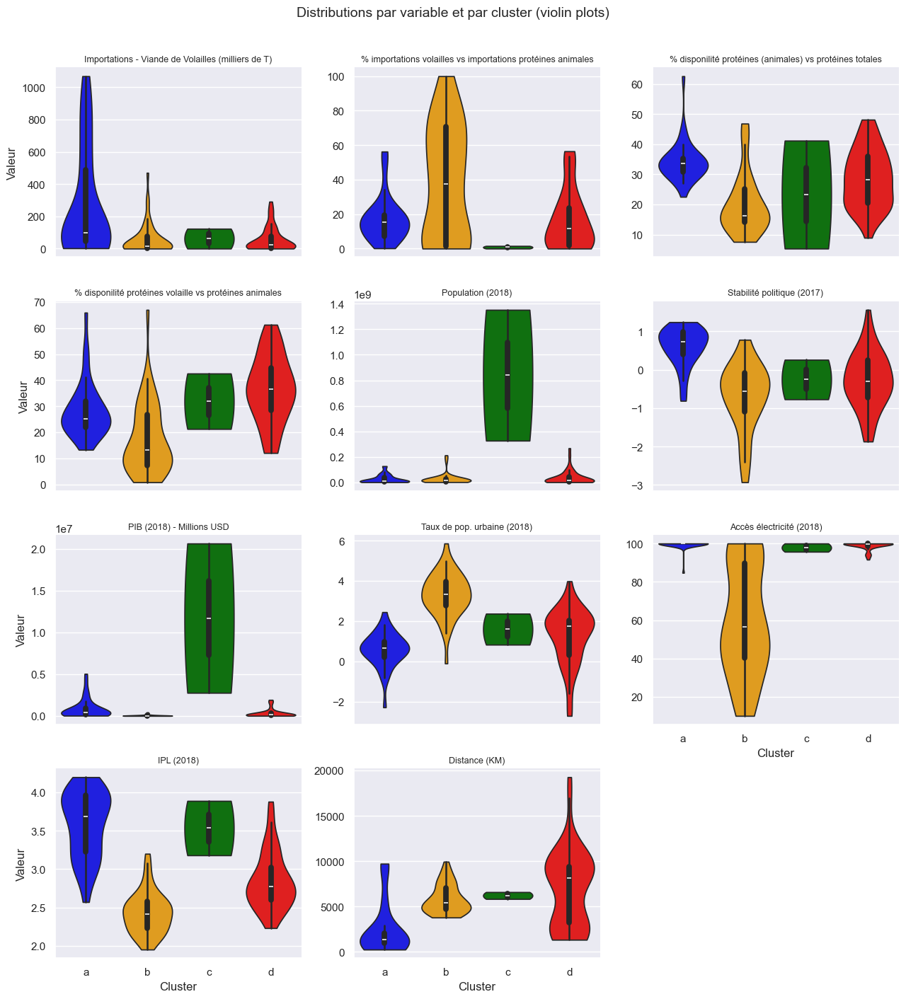

In [120]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Variables à tracer (mêmes que tes boxplots) ---
vars_cols = [
    'Importations - Viande de Volailles (milliers de T)',
    '% importations volailles vs importations protéines animales',
    '% disponilité protéines (animales) vs protéines totales',
    '% disponilité protéines volaille vs protéines animales',
    'Population (2018)',
    'Stabilité politique (2017)',
    'PIB (2018) - Millions USD',
    'Taux de pop. urbaine (2018)',
    'Accès électricité (2018)',
    'IPL (2018)',
    'Distance (KM)',
]

# --- Préparation des données en format "long" ---
df_viz = df_final_iso3_quanti.dropna(subset=vars_cols + ['clusters_den']).copy()
df_long = df_viz.melt(id_vars='clusters_den', value_vars=vars_cols,
                      var_name='variable', value_name='value')
df_long['clusters_den'] = df_long['clusters_den'].str.lower()
cluster_order = [c for c in ['a','b','c','d'] if c in df_long['clusters_den'].unique()]

# --- Palette personnalisée ---
palette = {'a':'blue', 'b':'orange', 'c':'green', 'd':'red'}

# --- Violin plots facettés (sans warnings) ---
g = sns.catplot(
    data=df_long, kind='violin',
    x='clusters_den', y='value',
    hue='clusters_den',  # = même variable que x pour colorer correctement
    col='variable', col_wrap=3,
    order=cluster_order, hue_order=cluster_order,
    inner='box', density_norm='width', cut=0,
    sharey=False, sharex=True, legend=False,
    palette=palette, height=3.6, aspect=1.2
)

# Titres & labels
g.set_axis_labels("Cluster", "Valeur")
for ax in g.axes.flatten():
    ax.set_title(ax.get_title().replace('variable = ', ''), fontsize=9)
    ax.tick_params(axis='x', labelrotation=0)

plt.subplots_adjust(top=0.92)
g.fig.suptitle("Distributions par variable et par cluster (violin plots)", fontsize=14)
plt.show()


A la lecture des boxplots précédents, voici les clusters les plus intéressants par variable :

- Importations - Viande de Volailles (milliers de T) : Cluster a (surpasse de loin les autres clusters)
- % importations volailles vs importations protéines animales : Cluster d
- % disponilité protéines (animales) vs protéines totales : Cluster a
- % disponilité protéines volaille vs protéines animales : Cluster b
- Population (2018) : Cluster c (dépasse de loin les autres clusters)
- Stabilité politique (2017) : Cluster a
- PIB (2018) - Millions USD : on veut les PIB max => cluster c
- Taux de pop. urbaine (2018) : on privilégie les zones urbaines => cluster d
- Accès électricité (2018) : les pays des clusters a, b et c ont un bon accès mais le cluster a a le boxplot le moins étalé
- IPL (2018) : on cherche un IPL le plus élevé possible => cluster a et c
- Distance (KM) : On cherche à minimiser la distance pour les coûts de logistique => cluster a

Recommandations : 


- Le cluster a est donc le cluster le plus intéressant si l'on souhaite commercialiser des poulets à l'international : il constitue le cluster privilégié pour 6 des 11 variables initiales. En choissant d'étendre l'activité dans les pays du cluster a, on minimise les frais et les complexités logistiques liées aux infrastructures, on minimise les risques géopolitiques, et on vient répondre à des besoins réels d'importation de viande de volaille.
  
- On remarque que le cluster a concentre l'essentiel des importations de volailles en valeur alors même que le cluster c comporte beaucoup plus d'habitants, produit plus de richesse et que les pays du cluster d importent une proportion de viande de volaille plus importante que les autres clusters.
  
- Contrairement à ce que l'on pourrait penser, ce sont les pays les moins densément peuplés qui ont les besoins les plus forts d'importations de volaille (pour diverses raisons, peut-être que les pays du cluster a ne peuvent subvenir en totalité à leurs besoins de consommation de volaille uniquement par le biais d'une production interne, et que leurs habitants aiment consommer plus de viandes de volaille que les pays composant les autres clusters).
  
- Liste des 35 pays composant le cluster a : Autriche, Bulgarie, Canada, Chypre, Danemark, Bélarus, Estonie, Finlande, France, Allemagne, Grèce, Chine - RAS de Hong Kong, Hongrie, Croatie, Irlande, Italie, Japon, Lettonie, Lituanie, Mexique, Pays-Bas, Norvège, République tchèque, Pologne, Portugal, Arabie saoudite, Slovénie, République slovaque, Afrique du Sud, Espagne, Suède, Suisse, Émirats arabes unis, Royaume-Uni, Belgique

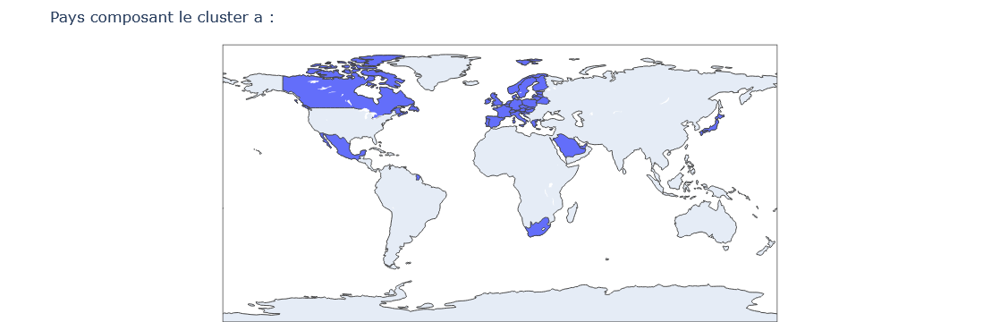

In [115]:
#Mappemonde colorimétrique représentant uniquement les pays du cluster a

df_cluster_a = df_final_iso3.loc[df_final_iso3['clusters_den']=='a']
fig = px.choropleth(df_cluster_a, locations="Code Zone_ISO3", color="clusters_den", hover_name="Zone")
fig.update_layout(title_text='Pays composant le cluster a :', showlegend=False, margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

In [116]:
#Affichage des pays composant le cluster a en détail - Tri par Importations, Stabilité Politique et Distance
df_cluster_a = df_final_iso3.loc[df_final_iso3['clusters_den']=='a']
df_cluster_a.drop('index', axis=1, inplace=True)
df_cluster_a.reset_index(inplace=True)
df_cluster_a = df_cluster_a.sort_values(by=['Importations - Viande de Volailles (milliers de T)', 'Distance (KM)', 'Stabilité politique (2017)'], ascending=[False, True, False])
display(df_cluster_a)

C:\Users\david\AppData\Local\Temp\ipykernel_22100\1388942541.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,index,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den,clusters_kmeans
15,58,JPN,Japon,1069.0,13.80,40.05,20.89,127202192,1.10,5.040881e+06,-0.038428,100.0,Japon,4.03,9725.6290,a,c
18,76,MEX,Mexique,972.0,34.02,29.81,33.30,126190788,-0.81,1.256300e+06,1.307801,99.5,Mexique,3.05,9206.8130,a,c
10,45,HKG,"Chine, RAS de Hong Kong",907.0,26.80,62.59,25.79,7371730,0.82,3.617311e+05,0.800231,100.0,"Chine, RAS de Hong Kong",3.92,9639.4760,a,a
8,37,DEU,Allemagne,842.0,16.57,32.44,23.58,83124418,0.57,4.052008e+06,0.366515,100.0,Allemagne,4.20,439.8984,a,c
32,117,GBR,Royaume-Uni,779.0,19.22,35.11,37.76,67141684,0.38,2.871532e+06,0.794683,100.0,Royaume-Uni,3.99,342.9475,a,c
24,98,SAU,Arabie saoudite,722.0,56.27,26.97,65.97,33702756,-0.65,8.465838e+05,-2.288640,99.9,Arabie saoudite,3.01,4694.5000,a,a
19,81,NLD,Pays-Bas,608.0,17.99,33.55,24.20,17059560,0.91,9.297336e+05,1.036375,100.0,Pays-Bas,4.02,427.9169,a,a
27,103,ZAF,Afrique du Sud,514.0,55.39,33.04,51.23,57792518,-0.28,4.052607e+05,2.446340,84.7,Afrique du Sud,3.38,9353.5520,a,c
7,33,FRA,France,506.0,13.46,36.09,22.13,64990511,0.27,2.781576e+06,0.687213,100.0,France,3.84,278.1876,a,c
31,115,ARE,Émirats arabes unis,433.0,46.91,27.72,49.78,9630959,0.60,4.270494e+05,1.647059,100.0,Émirats arabes unis,3.96,5249.5350,a,a


Nous allons nous focaliser sur les pays important le plus de volailles, les plus proches de la France et à la stabilité politique la plus élevée. Si on retient ces 3 critères, voici le top 10 des pays les plus intéressants parmi le cluster a : 

- Allemagne : 842 m. de T (Importations) / Indice : +0.57 /  440km de distance
- Royaume-Uni : 779 m. de T (Importations) / Indice : +0.38 /  343km de distance
- Pays-Bas : 608 m. de T (Importations) / Indice : +0.91 /  428km de distance
- France :  506m. de T (Importations) / Indice : +0.27 /  278km de distance
- Belgique : 338m. de T (Importations) / Indice : +0.42 /  262km de distance
- Espagne : 205m. de T (Importations) / Indice : +0.27 /  1055km de distance
- Danemark : 133m. de T (Importations) / Indice : +0..85 /  1028km de distance
- République tchèque : 116m. de T (Importations) / Indice : +0.99 /  885km de distance
- Autriche : 110m. de T (Importations) / Indice : +1.03 /  1035km de distance
- Bulgarie : 108m. de T (Importations) / Indice : +0.32 /  1761km de distance


In [118]:
#Affichage en détail des pays du Top 10 du cluster a
liste_top10_cluster_a = ['Allemagne', 'Royaume-Uni', 'Pays-Bas','France' ,'Belgique', 'Espagne', 'Danemark', 'République tchèque', 'Autriche', 'Irlande']
df_top10_cluster_a = df_cluster_a[df_cluster_a['Zone'].isin(liste_top10_cluster_a)]
df_top10_cluster_a

,index,Code Zone_ISO3,Zone,Importations - Viande de Volailles (milliers de T),% importations volailles vs importations protéines animales,% disponilité protéines (animales) vs protéines totales,% disponilité protéines volaille vs protéines animales,Population (2018),Stabilité politique (2017),PIB (2018) - Millions USD,Taux de pop. urbaine (2018),Accès électricité (2018),Country Name,IPL (2018),Distance (KM),clusters_den,clusters_kmeans
8,37,DEU,Allemagne,842.0,16.57,32.44,23.58,83124418,0.57,4.052008e+06,0.366515,100.0,Allemagne,4.20,439.8984,a,c
32,117,GBR,Royaume-Uni,779.0,19.22,35.11,37.76,67141684,0.38,2.871532e+06,0.794683,100.0,Royaume-Uni,3.99,342.9475,a,c
19,81,NLD,Pays-Bas,608.0,17.99,33.55,24.20,17059560,0.91,9.297336e+05,1.036375,100.0,Pays-Bas,4.02,427.9169,a,a
7,33,FRA,France,506.0,13.46,36.09,22.13,64990511,0.27,2.781576e+06,0.687213,100.0,France,3.84,278.1876,a,c
33,126,BEL,Belgique,338.0,23.92,28.37,15.90,11482178,0.42,5.426389e+05,0.496003,100.0,Belgique,4.04,262.3845,a,a
28,104,ESP,Espagne,205.0,6.66,43.46,26.82,46692858,0.27,1.431643e+06,0.752070,100.0,Espagne,3.83,1054.6560,a,a
3,25,DNK,Danemark,133.0,6.80,35.33,32.51,5752126,0.85,3.552934e+05,0.629089,100.0,Danemark,3.99,1027.6090,a,a
21,89,CZE,République tchèque,116.0,15.83,33.95,25.54,10665677,0.99,2.519924e+05,0.493103,100.0,République tchèque,3.68,884.6105,a,a
0,7,AUT,Autriche,110.0,19.03,32.05,21.62,8891388,1.03,4.525823e+05,0.835906,100.0,Autriche,4.03,1035.1440,a,a
13,52,IRL,Irlande,99.0,22.35,34.30,31.96,4818690,0.99,3.954612e+05,1.805029,100.0,Irlande,3.51,778.2031,a,a
